In [286]:
import pickle
import pandas as pd
import numpy as np
import itertools
from IPython.core.display import Image, display
import scipy.ndimage
import random
import numpy as np
import matplotlib.pylab as plt
import tqdm
import math
import sklearn
%matplotlib inline

# Загружаем датасет

In [213]:

with open('hw_1_train.pickle', 'rb') as f:
    train = pickle.load(f)

with open('hw_1_test_no_lables.pickle', 'rb') as f:
    test_no_lables = pickle.load(f)

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[5. 5. 6. ... 6. 5. 6.]


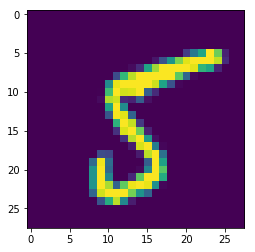

In [214]:
# Пример, как можно визуализировать данные
plt.imshow(train['data'][0].reshape(28,28))
#print(train['labels'][0])
#print(train['data'][0]);
#for i in range(28 * 28):
#    print(train['data'][0][i]);
print(train['data'])
print(train['labels'])

# Обучаем модель

In [290]:
x = train['data']/255
y = train['labels']

x = np.hstack([ np.ones((x.shape[0], 1)), x])

y[y == 5] = -1
y[y == 6] = 1
xTrain = x.copy()[:6750]
yTrain = y.copy()[:6750]
xTest = x.copy()[6750:]
yTest = y.copy()[6750:]
'''
xTrain, xTest, yTrain, yTest \
    = train_test_split(x, y, test_size = 0.1, random_state=10)
xTrain = np.hstack([ np.ones((xTrain.shape[0], 1)), xTrain] )
xTest = np.hstack([ np.ones((xTest.shape[0], 1)), xTest] )

mean = np.mean(xTrain, axis=0)
std = np.std(xTrain, axis=0)
xTrain = (xTrain - mean) / (std+0.000001)

mean = np.mean(xTest, axis=0)
std = np.std(xTest, axis=0)
xTest = (xTest - mean) / (std+0.000001)'''
Ltest = []
Ltrain = []
Atest = []
Atrain = []
print (xTest)

[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]


In [291]:
def logloss(x,y,w):
    r = 0
    for i in range(w.shape[0]):
        r = r + math.log(math.exp(-y[i]* (np.dot(w.T,x[i]))) + 1)
    print(w)
    return r/x.shape[0] 


In [292]:
def accuracy(x,y,w):
    c = 0
    probability = np.dot(x, w)
    for i in range(y.shape[0]):
        if ((probability[i] >= 0.5) & (y[i] == 1)) or \
           ((probability[i] < 0.5 ) & (y[i] == -1)):
            c = c + 1
        else:
            pass 
    return c/y.shape[0]

In [293]:
np.random.seed(1)
w = np.random.normal(scale=0.0001, size = xTrain.shape[1])



for iter in tqdm.tqdm_notebook(range(500)):
    for i in range(xTrain.shape[0]):
        j = np.random.randint(0, xTrain.shape[0])
        grad = - (yTrain[j] * xTrain[j] )/( 1 + math.exp( yTrain[j] * np.dot(w.T, xTrain[j])))
        w = w - 0.00001* grad
    Ltrain.append(logloss(xTrain, yTrain, w))
    Ltest.append(logloss(xTest, yTest, w))
    Atrain.append(accuracy(xTrain, yTrain, w))
    Atest.append(accuracy(xTest, yTest, w))


[ 1.10220757e-03 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.42518775e-05 -6.63353462e-05  1.96442083e-06
 -1.00172092e-04  5.80954369e-05  1.98385169e-04  1.27625284e-04
  1.08777474e-04  5.16939410e-05  4.38669698e-05  2.94317157e-04
  1.57947465e-04  1.10509582e-04  1.25413705e-04  2.71466511e-04
  4.96034100e-05  8.74829777e-05  4.00117874e-05 -3.30695018e-05
 -1.14251820e-04 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.28861

[-1.38892843e-03 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.40190917e-05 -6.56515377e-05  1.12703267e-05
 -7.45053499e-05  1.17083412e-04  2.49002159e-04  2.03735607e-04
  2.60702974e-04  2.48850928e-04  1.74194837e-04  4.54286235e-04
  3.60520431e-04  2.80585911e-04  2.56124755e-04  3.85346727e-04
  1.33077680e-04  1.41868005e-04  6.75359576e-05 -1.69859536e-05
 -9.77972482e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.33639

[-4.43963011e-03 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.36587570e-05 -6.45930546e-05  2.50547538e-05
 -5.01309380e-05  1.49528782e-04  2.81472332e-04  2.59117212e-04
  3.59218954e-04  3.93914626e-04  3.07622090e-04  5.86693489e-04
  4.94286032e-04  3.73356873e-04  3.40911307e-04  4.69755488e-04
  2.01845828e-04  1.87412153e-04  8.31245157e-05 -1.09779497e-05
 -9.55508603e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.36302

[-7.62415888e-03 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.32494287e-05 -6.33906527e-05  3.22709298e-05
 -3.04228914e-05  1.84951334e-04  3.12743216e-04  3.15199945e-04
  4.56614353e-04  5.03683342e-04  4.02303828e-04  6.91129330e-04
  6.06778756e-04  4.79637326e-04  4.41775313e-04  5.58159163e-04
  2.63696229e-04  2.21401765e-04  9.26699329e-05 -8.17436299e-06
 -9.36798344e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.38144

[-1.04990660e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.32494287e-05 -6.33906527e-05  3.34659697e-05
 -2.35446479e-05  2.13324590e-04  3.41401018e-04  3.51168418e-04
  5.23228179e-04  6.23253440e-04  4.94452219e-04  7.75415623e-04
  7.39794636e-04  6.07291592e-04  5.35414521e-04  6.42591886e-04
  3.26479956e-04  2.55380912e-04  1.09183248e-04 -4.17194408e-06
 -9.04881676e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.41937

[-1.31907322e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.32494287e-05 -6.33906527e-05  4.12726697e-05
 -7.03818415e-06  2.34232816e-04  3.62601151e-04  3.90559918e-04
  5.89462137e-04  7.17108809e-04  5.73208254e-04  8.59801939e-04
  8.29352746e-04  6.94030833e-04  5.87794901e-04  6.84113035e-04
  3.59264321e-04  2.84631574e-04  1.23277302e-04 -2.00349619e-06
 -9.04881676e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.44237

[-1.59411468e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.30701363e-05 -6.28639812e-05  4.47987579e-05
  3.75919430e-06  2.57494703e-04  3.83768532e-04  4.20821847e-04
  6.47140044e-04  8.03621725e-04  6.32720890e-04  9.40675379e-04
  9.13067824e-04  7.58553221e-04  6.49496286e-04  7.27008603e-04
  3.99975665e-04  3.11404803e-04  1.33788326e-04  1.82847260e-06
 -8.68010014e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.46323

[-1.83942410e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.30701363e-05 -6.28639812e-05  4.63591067e-05
  8.75753410e-06  2.72214395e-04  3.99071875e-04  4.49333449e-04
  6.86863828e-04  8.71629423e-04  6.89665413e-04  9.95018360e-04
  9.73593239e-04  8.19011166e-04  7.05365955e-04  7.82890652e-04
  4.41341610e-04  3.38927913e-04  1.44242380e-04  4.41939577e-06
 -8.56667167e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.51006

[-2.10616322e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.29994019e-05 -6.26561990e-05  4.92823554e-05
  1.58477546e-05  2.92157139e-04  4.14087081e-04  4.65479063e-04
  7.16880533e-04  9.24341704e-04  7.36809745e-04  1.03342921e-03
  1.02274733e-03  8.77791658e-04  7.48386029e-04  8.26192861e-04
  4.74568177e-04  3.58870821e-04  1.54971612e-04  1.07914142e-05
 -8.18255785e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.53710

[-2.32015084e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.28718988e-05 -6.22816585e-05  5.18198409e-05
  2.16563783e-05  3.04526320e-04  4.26322475e-04  4.82291020e-04
  7.55541786e-04  9.86691767e-04  7.91906577e-04  1.08520227e-03
  1.08289436e-03  9.29979747e-04  7.88494206e-04  8.56567897e-04
  5.03250214e-04  3.81478801e-04  1.62856203e-04  1.37141601e-05
 -8.09027068e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.53789

[-2.54473684e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.26501273e-05 -6.16302049e-05  5.39649517e-05
  2.84977795e-05  3.22288298e-04  4.42150361e-04  5.16408729e-04
  7.97703422e-04  1.03581828e-03  8.29255848e-04  1.12462535e-03
  1.12398824e-03  9.71396636e-04  8.19738727e-04  8.84563901e-04
  5.14721753e-04  3.89536137e-04  1.75367401e-04  1.53412512e-05
 -8.00634382e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.55371

[-2.76929522e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.25986257e-05 -6.14789189e-05  5.59598014e-05
  3.40737431e-05  3.37439982e-04  4.55329676e-04  5.35517794e-04
  8.33812417e-04  1.09438641e-03  8.68582843e-04  1.16021250e-03
  1.16553053e-03  1.00632703e-03  8.52989046e-04  9.16540666e-04
  5.38458724e-04  4.06240062e-04  1.86184948e-04  1.71894741e-05
 -8.00634382e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.56112

[-2.96856685e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.25497817e-05 -6.13354396e-05  5.84108987e-05
  4.02819844e-05  3.49259274e-04  4.65354699e-04  5.51150348e-04
  8.67938703e-04  1.14889289e-03  9.07064117e-04  1.19674403e-03
  1.20517400e-03  1.05319008e-03  8.82274891e-04  9.37150158e-04
  5.52678930e-04  4.14925156e-04  1.94349615e-04  2.06097635e-05
 -7.86640860e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.57772

[-3.15044579e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.24626003e-05 -6.10793444e-05  6.04142040e-05
  4.67607939e-05  3.61065482e-04  4.74875021e-04  5.63615415e-04
  8.90992899e-04  1.18440439e-03  9.39682800e-04  1.23874491e-03
  1.25336080e-03  1.09461912e-03  9.12920162e-04  9.61049680e-04
  5.69521276e-04  4.25790098e-04  2.00398717e-04  2.18410983e-05
 -7.80170314e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.58681

[-3.32387168e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.24228146e-05 -6.09624738e-05  6.26832301e-05
  5.27224454e-05  3.74408859e-04  4.84635146e-04  5.73491028e-04
  9.10698058e-04  1.21921540e-03  9.74184751e-04  1.27429393e-03
  1.29708511e-03  1.12518295e-03  9.38449619e-04  9.86659826e-04
  5.91442297e-04  4.41846556e-04  2.06587708e-04  2.27876019e-05
 -7.80170314e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.60028

[-3.57090512e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.23840376e-05 -6.08485662e-05  6.57828322e-05
  5.98340935e-05  3.84702305e-04  4.94114949e-04  5.86990670e-04
  9.30900249e-04  1.25532666e-03  1.00826875e-03  1.30625560e-03
  1.32727583e-03  1.15805215e-03  9.66766606e-04  1.01199687e-03
  6.13535699e-04  4.55290682e-04  2.11139757e-04  2.33225246e-05
 -7.80170314e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.60657

[-3.74161879e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.23471641e-05 -6.07402503e-05  6.67007992e-05
  6.38782041e-05  4.01930386e-04  5.07816616e-04  6.01658639e-04
  9.54366652e-04  1.28857675e-03  1.03946972e-03  1.33733252e-03
  1.36049220e-03  1.18983447e-03  9.92887730e-04  1.03503062e-03
  6.29451364e-04  4.71306079e-04  2.24707156e-04  2.52331911e-05
 -7.75043568e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.61857

[-3.87712521e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.23124915e-05 -6.06383997e-05  6.79046941e-05
  6.70851675e-05  4.12467834e-04  5.16059230e-04  6.11144258e-04
  9.74025613e-04  1.31899532e-03  1.06277416e-03  1.36343309e-03
  1.38965299e-03  1.21797231e-03  1.02010244e-03  1.05807069e-03
  6.40587457e-04  4.81188313e-04  2.37080166e-04  2.75845417e-05
 -7.70037269e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.62802

[-4.07104519e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.22455212e-05 -6.04416743e-05  6.94215454e-05
  7.19415841e-05  4.23700541e-04  5.26984286e-04  6.23861598e-04
  9.89394523e-04  1.35083668e-03  1.08582817e-03  1.38799349e-03
  1.41740089e-03  1.23780840e-03  1.03838965e-03  1.07738298e-03
  6.56815992e-04  4.94047350e-04  2.45278854e-04  2.87132393e-05
 -7.65315476e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.63505

[-4.26202484e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.20873705e-05 -5.99771068e-05  7.20584978e-05
  7.86803719e-05  4.33488237e-04  5.34895455e-04  6.37099937e-04
  1.01399037e-03  1.37908651e-03  1.11346541e-03  1.41415899e-03
  1.43743695e-03  1.25833944e-03  1.05635037e-03  1.09578783e-03
  6.70272682e-04  5.05010455e-04  2.52796278e-04  3.00708632e-05
 -7.65315476e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.64709

[-4.45941433e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.20873705e-05 -5.99771068e-05  7.32298093e-05
  8.20155740e-05  4.47424199e-04  5.43848168e-04  6.47035030e-04
  1.03451997e-03  1.41310499e-03  1.13303108e-03  1.43125657e-03
  1.46322768e-03  1.28828731e-03  1.07825995e-03  1.11565965e-03
  6.85248435e-04  5.13312572e-04  2.56629081e-04  3.11246034e-05
 -7.56726220e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.65054

[-4.57722757e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.19999402e-05 -5.97202803e-05  7.48840888e-05
  8.54566087e-05  4.52546541e-04  5.49571279e-04  6.55584677e-04
  1.05446721e-03  1.45481496e-03  1.15655913e-03  1.45199127e-03
  1.48688959e-03  1.31648702e-03  1.10187436e-03  1.13306410e-03
  6.99410689e-04  5.24054126e-04  2.64637237e-04  3.17281296e-05
 -7.56726220e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.65834

[-4.71687770e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.19169742e-05 -5.94765677e-05  7.69346294e-05
  9.05737000e-05  4.60608675e-04  5.55012051e-04  6.65697601e-04
  1.07613167e-03  1.48844980e-03  1.17848018e-03  1.47263329e-03
  1.51264008e-03  1.34286655e-03  1.12063261e-03  1.15214830e-03
  7.13518799e-04  5.35221289e-04  2.74174036e-04  3.30116917e-05
 -7.48976487e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.66246

[-4.88023041e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.18643726e-05 -5.93220503e-05  7.91772348e-05
  9.55016474e-05  4.68206377e-04  5.60522199e-04  6.74279690e-04
  1.09428474e-03  1.51337247e-03  1.20507868e-03  1.49245206e-03
  1.53129816e-03  1.35752213e-03  1.13285312e-03  1.16582187e-03
  7.26273508e-04  5.45082959e-04  2.79633771e-04  3.40664899e-05
 -7.41668884e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.66572

[-5.00825524e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.17365163e-05 -5.89464724e-05  7.98500263e-05
  9.80728563e-05  4.78740914e-04  5.66962206e-04  6.83023294e-04
  1.11391884e-03  1.54240047e-03  1.22747938e-03  1.50995481e-03
  1.55019798e-03  1.37860752e-03  1.14834024e-03  1.18209878e-03
  7.36091605e-04  5.52385912e-04  2.85556777e-04  3.52783856e-05
 -7.38197986e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.67692

[-5.15828481e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.17365163e-05 -5.89464724e-05  8.06574940e-05
  1.00183084e-04  4.84657488e-04  5.72449433e-04  6.91523221e-04
  1.13112284e-03  1.57185802e-03  1.25383751e-03  1.52833631e-03
  1.56965728e-03  1.40077673e-03  1.16566140e-03  1.19448864e-03
  7.46765900e-04  5.61655984e-04  2.93737360e-04  3.62810234e-05
 -7.34816055e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.67917

[-5.34381886e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.16886185e-05 -5.88057726e-05  8.14926298e-05
  1.03118084e-04  4.91875666e-04  5.79152035e-04  7.01585697e-04
  1.14503093e-03  1.59436339e-03  1.26955683e-03  1.54157091e-03
  1.58195419e-03  1.41741149e-03  1.17957456e-03  1.20455257e-03
  7.53989747e-04  5.66470108e-04  2.96676618e-04  3.68458378e-05
 -7.34816055e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.68019

[-5.49542670e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.16655422e-05 -5.87379861e-05  8.25069297e-05
  1.05597628e-04  4.96883584e-04  5.83302556e-04  7.09223307e-04
  1.16055669e-03  1.62018080e-03  1.28801808e-03  1.55774468e-03
  1.59875177e-03  1.43529170e-03  1.19303424e-03  1.21587477e-03
  7.64441592e-04  5.75465467e-04  3.01945065e-04  3.84065070e-05
 -7.25347139e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.68774

[-5.64772066e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.16655422e-05 -5.87379861e-05  8.36746519e-05
  1.08940504e-04  5.04265465e-04  5.89009654e-04  7.16557185e-04
  1.17498143e-03  1.64928124e-03  1.30746754e-03  1.57508087e-03
  1.61894695e-03  1.45331966e-03  1.20580566e-03  1.22715691e-03
  7.73227624e-04  5.83195104e-04  3.10062516e-04  3.95386764e-05
 -7.22290426e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.69176

[-5.79018715e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.16655422e-05 -5.87379861e-05  8.48041471e-05
  1.12041536e-04  5.15034118e-04  5.95935267e-04  7.25876630e-04
  1.19186919e-03  1.67327258e-03  1.32461319e-03  1.59381721e-03
  1.64047623e-03  1.47250131e-03  1.21950808e-03  1.23682041e-03
  7.79487059e-04  5.90412328e-04  3.18627011e-04  4.10415787e-05
 -7.16405028e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.69369

[-5.92739543e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.16655422e-05 -5.87379861e-05  8.60402609e-05
  1.15015392e-04  5.23355974e-04  6.01765288e-04  7.31975913e-04
  1.20461985e-03  1.69660466e-03  1.33885711e-03  1.60900991e-03
  1.65858459e-03  1.49002914e-03  1.23205234e-03  1.24895193e-03
  7.90070896e-04  5.97164868e-04  3.20357452e-04  4.20302778e-05
 -7.07770900e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.69742

[-6.03462943e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.16454120e-05 -5.86788536e-05  8.68101533e-05
  1.16663540e-04  5.27427533e-04  6.06362507e-04  7.39012250e-04
  1.21620427e-03  1.71676546e-03  1.35408376e-03  1.62529710e-03
  1.67480813e-03  1.50965476e-03  1.24680857e-03  1.25751266e-03
  7.98496987e-04  6.05027211e-04  3.24976478e-04  4.34121135e-05
 -6.96813828e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.70524

[-6.17412534e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.16062771e-05 -5.85638948e-05  8.83459985e-05
  1.20301445e-04  5.36305455e-04  6.10786352e-04  7.45148154e-04
  1.22654398e-03  1.73679454e-03  1.37037851e-03  1.64124132e-03
  1.69439376e-03  1.52673872e-03  1.25995611e-03  1.27035313e-03
  8.07075840e-04  6.11664527e-04  3.30513890e-04  4.48796642e-05
 -6.91501161e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.71222

[-6.30900980e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.15872852e-05 -5.85081063e-05  8.93629576e-05
  1.23028834e-04  5.46932920e-04  6.17517137e-04  7.52820663e-04
  1.23985318e-03  1.76265492e-03  1.38969821e-03  1.65634295e-03
  1.71000506e-03  1.54310129e-03  1.26985365e-03  1.28028535e-03
  8.17450249e-04  6.18283498e-04  3.32568246e-04  4.55332847e-05
 -6.86323544e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.71505

[-6.42304773e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.15687192e-05 -5.84535684e-05  9.03930932e-05
  1.25647804e-04  5.53586418e-04  6.22339480e-04  7.59820631e-04
  1.25156952e-03  1.77800235e-03  1.40426093e-03  1.67010996e-03
  1.72313038e-03  1.55634291e-03  1.28227207e-03  1.28979749e-03
  8.24112209e-04  6.24303551e-04  3.38111976e-04  4.65315505e-05
 -6.83844587e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.71830

[-6.57191378e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.15135900e-05 -5.82916265e-05  9.07565924e-05
  1.27091052e-04  5.58856248e-04  6.26848915e-04  7.63175606e-04
  1.26172212e-03  1.80104196e-03  1.41814135e-03  1.68581849e-03
  1.73836553e-03  1.56927696e-03  1.29233019e-03  1.29893397e-03
  8.30157346e-04  6.28281823e-04  3.40444894e-04  4.68005106e-05
 -6.83844587e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.72554

[-6.67900931e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.14956282e-05 -5.82388637e-05  9.17225560e-05
  1.29691036e-04  5.66707240e-04  6.32222471e-04  7.69937101e-04
  1.27086707e-03  1.81878762e-03  1.43071465e-03  1.70007083e-03
  1.75706810e-03  1.58600905e-03  1.30506277e-03  1.31061951e-03
  8.37738572e-04  6.32718535e-04  3.42763326e-04  4.75794095e-05
 -6.76667936e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.72787

[-6.81241869e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.14956282e-05 -5.82388637e-05  9.24717944e-05
  1.31590550e-04  5.75229858e-04  6.37570225e-04  7.73771339e-04
  1.27824787e-03  1.83368487e-03  1.44383839e-03  1.71203123e-03
  1.77057740e-03  1.60060387e-03  1.31499429e-03  1.31854049e-03
  8.43512444e-04  6.36958911e-04  3.48644524e-04  4.83245136e-05
 -6.74357199e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.73097

[-6.97965876e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.14783365e-05 -5.81880693e-05  9.30946485e-05
  1.33951956e-04  5.80822372e-04  6.42694415e-04  7.81766252e-04
  1.29089129e-03  1.85597540e-03  1.45801761e-03  1.72575328e-03
  1.78766655e-03  1.61483488e-03  1.32254900e-03  1.32830705e-03
  8.50937663e-04  6.40026117e-04  3.50030249e-04  4.92257378e-05
 -6.69819297e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.73552

[-7.09264214e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.14442113e-05 -5.80878265e-05  9.39240995e-05
  1.36205674e-04  5.89191362e-04  6.47712456e-04  7.86710974e-04
  1.30134409e-03  1.87619468e-03  1.46773047e-03  1.73748575e-03
  1.80183134e-03  1.63124211e-03  1.33291619e-03  1.33568843e-03
  8.59821031e-04  6.46618181e-04  3.52135852e-04  4.96341884e-05
 -6.67579885e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.73955

[-7.21537940e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.14105329e-05 -5.79888964e-05  9.49096076e-05
  1.38710323e-04  5.92712436e-04  6.50921076e-04  7.91934289e-04
  1.31053099e-03  1.89846709e-03  1.48285443e-03  1.75074778e-03
  1.81612385e-03  1.64032809e-03  1.34173010e-03  1.34687620e-03
  8.71696656e-04  6.56181894e-04  3.56963786e-04  5.05664376e-05
 -6.63207973e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.74131

[-7.33746400e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.13942674e-05 -5.79411163e-05  9.54858070e-05
  1.40172223e-04  5.96795035e-04  6.54372370e-04  7.97152222e-04
  1.31940299e-03  1.92000954e-03  1.50059679e-03  1.76242219e-03
  1.82908924e-03  1.65052374e-03  1.34914164e-03  1.35591464e-03
  8.78719906e-04  6.60788906e-04  3.57454218e-04  5.07196965e-05
 -6.61066697e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.74400

[-7.46700153e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.13623998e-05 -5.78475054e-05  9.68783228e-05
  1.42776030e-04  6.00697986e-04  6.57112910e-04  8.01466091e-04
  1.32796368e-03  1.93514843e-03  1.51603631e-03  1.77519824e-03
  1.84136340e-03  1.66407705e-03  1.35923793e-03  1.36367165e-03
  8.85349862e-04  6.64866574e-04  3.58840027e-04  5.09773932e-05
 -6.61066697e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.74544

[-7.56553663e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.13155318e-05 -5.77098306e-05  9.78983201e-05
  1.45217327e-04  6.06471405e-04  6.60623922e-04  8.08198079e-04
  1.33809102e-03  1.94779671e-03  1.52794011e-03  1.78741409e-03
  1.85417490e-03  1.67907728e-03  1.36893931e-03  1.36966788e-03
  8.89724805e-04  6.68658406e-04  3.62081216e-04  5.13002801e-05
 -6.61066697e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.74868

[-7.67695711e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.12549227e-05 -5.75317912e-05  9.82962871e-05
  1.46678034e-04  6.11597271e-04  6.64284000e-04  8.13315196e-04
  1.34738011e-03  1.96952877e-03  1.54020508e-03  1.79770966e-03
  1.86616037e-03  1.68854141e-03  1.37755979e-03  1.37548211e-03
  8.92769653e-04  6.70938609e-04  3.64967091e-04  5.20343858e-05
 -6.55225229e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.75038

[-7.79640008e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.12400522e-05 -5.74881091e-05  9.82971617e-05
  1.47298593e-04  6.17725840e-04  6.67834463e-04  8.19282789e-04
  1.35713982e-03  1.98884730e-03  1.55692809e-03  1.80818614e-03
  1.87705754e-03  1.69950052e-03  1.38667743e-03  1.38382005e-03
  8.97937012e-04  6.74116779e-04  3.68166576e-04  5.27133420e-05
 -6.53337413e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.75418

[-7.91408422e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.11965295e-05 -5.73602612e-05  9.87264696e-05
  1.49317651e-04  6.25734883e-04  6.73456388e-04  8.23195216e-04
  1.36488973e-03  2.00421545e-03  1.56693766e-03  1.81834259e-03
  1.88932114e-03  1.71027716e-03  1.39467183e-03  1.39270503e-03
  9.04910629e-04  6.79844737e-04  3.71201052e-04  5.33001462e-05
 -6.49617428e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.75976

[-8.06118598e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.11821231e-05 -5.73179425e-05  9.92125165e-05
  1.50637453e-04  6.29750126e-04  6.75858781e-04  8.26296571e-04
  1.37633442e-03  2.01776226e-03  1.57860013e-03  1.82813765e-03
  1.90034846e-03  1.72192896e-03  1.40319407e-03  1.39999934e-03
  9.08639836e-04  6.82029049e-04  3.71845304e-04  5.35441540e-05
 -6.47784095e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.76215

[-8.15264377e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.11679985e-05 -5.72764516e-05  1.00033477e-04
  1.52345021e-04  6.33182213e-04  6.78843543e-04  8.30809251e-04
  1.38319058e-03  2.03108132e-03  1.58906475e-03  1.83972557e-03
  1.91322672e-03  1.73237985e-03  1.41174143e-03  1.40912523e-03
  9.13153184e-04  6.84530622e-04  3.73542378e-04  5.39832459e-05
 -6.45992279e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.76374

[-8.27773443e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.11266734e-05 -5.71550591e-05  1.00584447e-04
  1.53874498e-04  6.36328193e-04  6.81163149e-04  8.33888009e-04
  1.38986027e-03  2.05239499e-03  1.60075237e-03  1.84842098e-03
  1.92285096e-03  1.74403073e-03  1.42032380e-03  1.41859293e-03
  9.20603668e-04  6.91101659e-04  3.79281866e-04  5.50593597e-05
 -6.38976379e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.76531

[-8.40808700e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.11266734e-05 -5.71550591e-05  1.01071750e-04
  1.55025610e-04  6.40744375e-04  6.83592124e-04  8.37074398e-04
  1.39740664e-03  2.06657347e-03  1.61135773e-03  1.85719747e-03
  1.93136835e-03  1.75202202e-03  1.42699403e-03  1.42433851e-03
  9.24231969e-04  6.94957699e-04  3.83574251e-04  5.58905623e-05
 -6.35525422e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.76605

[-8.50658669e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.11131850e-05 -5.71154368e-05  1.01781409e-04
  1.56889993e-04  6.47707375e-04  6.87529204e-04  8.40415265e-04
  1.40160471e-03  2.08288189e-03  1.62308622e-03  1.86514656e-03
  1.94079729e-03  1.76188458e-03  1.43337914e-03  1.42956486e-03
  9.28485421e-04  6.98014272e-04  3.84208213e-04  5.62366102e-05
 -6.32117163e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.76931

[-8.61053635e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.11131850e-05 -5.71154368e-05  1.02556944e-04
  1.58676860e-04  6.53054955e-04  6.90975024e-04  8.44343179e-04
  1.41125476e-03  2.10104359e-03  1.63539030e-03  1.87474783e-03
  1.95218770e-03  1.77097051e-03  1.43951302e-03  1.43616550e-03
  9.34401873e-04  7.03274321e-04  3.90007554e-04  5.68920973e-05
 -6.30431602e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.77174

[-8.74849799e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.11001030e-05 -5.70770085e-05  1.02882896e-04
  1.59786438e-04  6.57253484e-04  6.93369002e-04  8.47406300e-04
  1.41863961e-03  2.11543137e-03  1.64637204e-03  1.88383424e-03
  1.96397659e-03  1.78194214e-03  1.44611459e-03  1.44182893e-03
  9.39203783e-04  7.07960375e-04  3.94151921e-04  5.74803812e-05
 -6.27156291e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.77341

[-8.85426157e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.10613562e-05 -5.69631897e-05  1.03376171e-04
  1.61302144e-04  6.61252661e-04  6.96814980e-04  8.51728905e-04
  1.42686064e-03  2.13261831e-03  1.65798431e-03  1.89303561e-03
  1.97353689e-03  1.79017866e-03  1.45289729e-03  1.44754445e-03
  9.43619715e-04  7.12067386e-04  3.96238824e-04  5.77781871e-05
 -6.25553195e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.77557

[-8.93715182e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.10232340e-05 -5.68512058e-05  1.04553733e-04
  1.64072119e-04  6.66681519e-04  7.00551932e-04  8.55072504e-04
  1.43448046e-03  2.15461394e-03  1.67085805e-03  1.90332519e-03
  1.98327299e-03  1.79904284e-03  1.45916534e-03  1.45285637e-03
  9.48625354e-04  7.16926714e-04  4.00109454e-04  5.84399054e-05
 -6.23955021e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.77794

[-9.03075390e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.09982695e-05 -5.67778724e-05  1.05120370e-04
  1.65543707e-04  6.70636263e-04  7.03086220e-04  8.59243132e-04
  1.44169195e-03  2.16547766e-03  1.68422061e-03  1.91335318e-03
  1.99169691e-03  1.80827021e-03  1.46691559e-03  1.46035025e-03
  9.53848122e-04  7.20902899e-04  4.03711446e-04  5.89976667e-05
 -6.20859694e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.77873

[-9.11876725e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.09735816e-05 -5.67053519e-05  1.05860484e-04
  1.67219285e-04  6.73657909e-04  7.05482053e-04  8.61897088e-04
  1.44764352e-03  2.17477600e-03  1.69328928e-03  1.92192156e-03
  2.00178527e-03  1.81832299e-03  1.47545542e-03  1.46889385e-03
  9.59586201e-04  7.24093036e-04  4.05360639e-04  5.95847010e-05
 -6.16287709e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.78075

[-9.21590878e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.09494867e-05 -5.66345730e-05  1.06395767e-04
  1.68625395e-04  6.77711558e-04  7.07815532e-04  8.65691555e-04
  1.45569243e-03  2.19243306e-03  1.70517567e-03  1.93158559e-03
  2.01271516e-03  1.82789096e-03  1.47978807e-03  1.47329723e-03
  9.63072023e-04  7.26190897e-04  4.06167970e-04  6.00580309e-05
 -6.13308070e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.78090

[-9.28836804e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.09494867e-05 -5.66345730e-05  1.07321545e-04
  1.70517680e-04  6.81283623e-04  7.09965883e-04  8.67543251e-04
  1.45932165e-03  2.20698584e-03  1.71868849e-03  1.94095607e-03
  2.02208963e-03  1.83658200e-03  1.48590023e-03  1.47854766e-03
  9.67290354e-04  7.28915319e-04  4.07365567e-04  6.03255242e-05
 -6.11832030e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.78188

[-9.36980407e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.09035000e-05 -5.64994871e-05  1.07775225e-04
  1.71867373e-04  6.86710190e-04  7.13141603e-04  8.71077128e-04
  1.46492988e-03  2.22387969e-03  1.73385879e-03  1.95061772e-03
  2.03210476e-03  1.84659563e-03  1.49416646e-03  1.48684966e-03
  9.72006003e-04  7.32327564e-04  4.09932258e-04  6.07404777e-05
 -6.10408381e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.78238

[-9.50877749e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.08920485e-05 -5.64658485e-05  1.08364568e-04
  1.73386759e-04  6.92413532e-04  7.16891115e-04  8.74471458e-04
  1.47026484e-03  2.23484561e-03  1.74309581e-03  1.95976389e-03
  2.04158894e-03  1.85788929e-03  1.50058231e-03  1.49095054e-03
  9.75139602e-04  7.36103148e-04  4.14429631e-04  6.14210925e-05
 -6.06191471e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.78423

[-9.60464128e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.08806493e-05 -5.64323632e-05  1.08673906e-04
  1.74357160e-04  6.98295812e-04  7.19910978e-04  8.76984889e-04
  1.47653331e-03  2.24815863e-03  1.75370315e-03  1.96986136e-03
  2.05280210e-03  1.86749321e-03  1.50612092e-03  1.49433309e-03
  9.78311795e-04  7.38673962e-04  4.15241669e-04  6.17973394e-05
 -6.02028119e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.78733

[-9.67219097e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.08469917e-05 -5.63334941e-05  1.08673906e-04
  1.75076592e-04  7.01041423e-04  7.21732723e-04  8.78516114e-04
  1.48065806e-03  2.25230388e-03  1.75642926e-03  1.97282965e-03
  2.05684812e-03  1.87171882e-03  1.50918343e-03  1.49780381e-03
  9.80540259e-04  7.40297497e-04  4.16354275e-04  6.18706281e-05
 -6.02028119e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.78835

[-9.76397256e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.08247467e-05 -5.62681493e-05  1.09464744e-04
  1.76949888e-04  7.05611776e-04  7.24388842e-04  8.81066473e-04
  1.48675669e-03  2.26517253e-03  1.76662192e-03  1.98107808e-03
  2.06551386e-03  1.88101406e-03  1.51507923e-03  1.50218704e-03
  9.84444328e-04  7.43419783e-04  4.17536809e-04  6.22984602e-05
 -5.99312282e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.79193

[-9.87278488e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.07693199e-05 -5.61053331e-05  1.09922377e-04
  1.78379150e-04  7.11108686e-04  7.27683628e-04  8.83146291e-04
  1.49178654e-03  2.27689882e-03  1.78019735e-03  1.99029827e-03
  2.07512346e-03  1.89106891e-03  1.52103948e-03  1.50770674e-03
  9.88558989e-04  7.46823248e-04  4.22250559e-04  6.26592486e-05
 -5.99312282e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.79373

[-9.97619725e-02 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.07473901e-05 -5.60409143e-05  1.10294002e-04
  1.79530191e-04  7.15307308e-04  7.30702229e-04  8.86467510e-04
  1.49929548e-03  2.29530406e-03  1.79263044e-03  1.99926572e-03
  2.08438423e-03  1.90102939e-03  1.52592025e-03  1.51266809e-03
  9.92815970e-04  7.50100280e-04  4.24739393e-04  6.30253356e-05
 -5.99312282e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.79482

[-1.00770432e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.07257268e-05 -5.59772783e-05  1.10809870e-04
  1.81120981e-04  7.20901180e-04  7.33783731e-04  8.88147062e-04
  1.50424227e-03  2.30392340e-03  1.80184536e-03  2.00752685e-03
  2.09422531e-03  1.90988859e-03  1.53146497e-03  1.51967668e-03
  9.97292137e-04  7.53904889e-04  4.28644940e-04  6.34729474e-05
 -5.98009559e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.79700

[-1.01685919e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.07150347e-05 -5.59458702e-05  1.11109050e-04
  1.81688499e-04  7.23431879e-04  7.35616078e-04  8.89945658e-04
  1.51166445e-03  2.31764695e-03  1.81017107e-03  2.01457136e-03
  2.10204457e-03  1.91831985e-03  1.53692656e-03  1.52469880e-03
  1.00089534e-03  7.57330325e-04  4.30954294e-04  6.37046880e-05
 -5.96717147e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.79779

[-1.02623437e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.07045120e-05 -5.59149598e-05  1.11628961e-04
  1.82975935e-04  7.28229759e-04  7.38121457e-04  8.91513430e-04
  1.51891536e-03  2.32901789e-03  1.82169564e-03  2.02161711e-03
  2.10929601e-03  1.92764603e-03  1.54296880e-03  1.53010104e-03
  1.00466262e-03  7.61637892e-04  4.36735709e-04  6.45069528e-05
 -5.94195926e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.79813

[-1.03691815e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.06940604e-05 -5.58842583e-05  1.11993822e-04
  1.83592245e-04  7.31016759e-04  7.39385242e-04  8.93418201e-04
  1.52412490e-03  2.34624293e-03  1.83174942e-03  2.02944658e-03
  2.11781592e-03  1.93393956e-03  1.54795596e-03  1.53543592e-03
  1.00820275e-03  7.64344704e-04  4.39496234e-04  6.47806343e-05
 -5.94195926e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.79978

[-1.04523528e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.06940604e-05 -5.58842583e-05  1.12149907e-04
  1.84315773e-04  7.35574840e-04  7.42872534e-04  8.95361804e-04
  1.52927130e-03  2.35774687e-03  1.84038518e-03  2.03649632e-03
  2.12572609e-03  1.94210122e-03  1.55249873e-03  1.53983340e-03
  1.01303340e-03  7.67810857e-04  4.41311359e-04  6.51422518e-05
 -5.92953412e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.80169

[-1.05484687e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.06940604e-05 -5.58842583e-05  1.12483094e-04
  1.85127392e-04  7.39337885e-04  7.45147374e-04  8.98213362e-04
  1.53332597e-03  2.37483407e-03  1.85112351e-03  2.04385144e-03
  2.13281217e-03  1.95012028e-03  1.55876427e-03  1.54544957e-03
  1.01651222e-03  7.69791256e-04  4.41880287e-04  6.52770332e-05
 -5.92953412e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.80362

[-1.06614814e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.06738239e-05 -5.58248137e-05  1.12710565e-04
  1.85735749e-04  7.42167840e-04  7.47119752e-04  9.00234741e-04
  1.53964616e-03  2.38532226e-03  1.86156416e-03  2.05223252e-03
  2.14096441e-03  1.95678162e-03  1.56485597e-03  1.55283419e-03
  1.02075296e-03  7.72744483e-04  4.44142844e-04  6.54745949e-05
 -5.92953412e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.80647

[-1.07470466e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.06539003e-05 -5.57662881e-05  1.13067160e-04
  1.86947625e-04  7.45671655e-04  7.50243969e-04  9.03396063e-04
  1.54613071e-03  2.39585278e-03  1.86879894e-03  2.05811756e-03
  2.14868039e-03  1.96440984e-03  1.56980828e-03  1.55711959e-03
  1.02445074e-03  7.76087360e-04  4.47581693e-04  6.57317536e-05
 -5.92953412e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.80902

[-1.08519008e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.06147377e-05 -5.56512479e-05  1.13386097e-04
  1.87717237e-04  7.50987461e-04  7.52912026e-04  9.05775919e-04
  1.55085996e-03  2.40999268e-03  1.87761834e-03  2.06386724e-03
  2.15521949e-03  1.97184235e-03  1.57591733e-03  1.56259395e-03
  1.02846174e-03  7.79296137e-04  4.50432533e-04  6.64869004e-05
 -5.85959660e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.81052

[-1.09802292e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.06147377e-05 -5.56512479e-05  1.13829715e-04
  1.88730424e-04  7.52605197e-04  7.54456456e-04  9.09040260e-04
  1.55812822e-03  2.42575311e-03  1.88770334e-03  2.07144027e-03
  2.16311439e-03  1.97788828e-03  1.58129543e-03  1.56857048e-03
  1.03190997e-03  7.81268056e-04  4.51640840e-04  6.67601651e-05
 -5.84806983e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.81140

[-1.10642402e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.05950916e-05 -5.55935375e-05  1.14218918e-04
  1.89886633e-04  7.56855663e-04  7.56310810e-04  9.10747252e-04
  1.56255549e-03  2.43930096e-03  1.89656018e-03  2.07903565e-03
  2.17118229e-03  1.98332302e-03  1.58499723e-03  1.57296344e-03
  1.03501897e-03  7.83815126e-04  4.54135822e-04  6.71934545e-05
 -5.81377302e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.81160

[-1.11438533e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.05950916e-05 -5.55935375e-05  1.14592385e-04
  1.91081367e-04  7.59873701e-04  7.58286740e-04  9.12835861e-04
  1.56685936e-03  2.44906055e-03  1.90297669e-03  2.08515551e-03
  2.17845640e-03  1.99183881e-03  1.59157936e-03  1.57944775e-03
  1.03814809e-03  7.86119167e-04  4.56459916e-04  6.78238931e-05
 -5.76886031e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.81264

[-1.12815074e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.05760297e-05 -5.55375432e-05  1.14765471e-04
  1.91981089e-04  7.65385596e-04  7.61353260e-04  9.16809986e-04
  1.57160357e-03  2.45973349e-03  1.91021399e-03  2.09132549e-03
  2.18494912e-03  1.99767915e-03  1.59730755e-03  1.58519430e-03
  1.04147324e-03  7.88754066e-04  4.58579460e-04  6.83085125e-05
 -5.73535782e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.81366

[-1.13712216e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.05665634e-05 -5.55097358e-05  1.15153031e-04
  1.92915912e-04  7.68316481e-04  7.62885570e-04  9.18628077e-04
  1.57655785e-03  2.47593989e-03  1.92039233e-03  2.09825434e-03
  2.19137165e-03  2.00502400e-03  1.60255891e-03  1.59034406e-03
  1.04442325e-03  7.91740840e-04  4.63454493e-04  6.88968167e-05
 -5.71308224e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.81532

[-1.14496295e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.05665634e-05 -5.55097358e-05  1.15447607e-04
  1.93910587e-04  7.74444744e-04  7.66128780e-04  9.21792865e-04
  1.58375841e-03  2.48589525e-03  1.92772159e-03  2.10303642e-03
  2.19710270e-03  2.01130149e-03  1.60780767e-03  1.59537632e-03
  1.04795857e-03  7.94160545e-04  4.65204705e-04  6.90171861e-05
 -5.71308224e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.81604

[-1.15426628e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.05571919e-05 -5.54822072e-05  1.15690421e-04
  1.95061407e-04  7.78357350e-04  7.68389761e-04  9.24920094e-04
  1.58737856e-03  2.49643896e-03  1.93726444e-03  2.10945930e-03
  2.20380346e-03  2.01790693e-03  1.61424004e-03  1.59970730e-03
  1.05129216e-03  7.97436119e-04  4.69084244e-04  6.95690165e-05
 -5.70215247e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.81739

[-1.16288707e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.05112308e-05 -5.53471965e-05  1.15867670e-04
  1.95879609e-04  7.83532641e-04  7.71044999e-04  9.26663462e-04
  1.59410160e-03  2.51013694e-03  1.94429548e-03  2.11629089e-03
  2.21306059e-03  2.02542328e-03  1.61936180e-03  1.60661713e-03
  1.05602691e-03  8.00865222e-04  4.70684635e-04  6.98374848e-05
 -5.68085213e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.81964

[-1.17068810e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.04929252e-05 -5.52934235e-05  1.16143380e-04
  1.96465429e-04  7.84456110e-04  7.72310587e-04  9.27916003e-04
  1.59763479e-03  2.52115630e-03  1.95236270e-03  2.12285814e-03
  2.22003122e-03  2.03265141e-03  1.62397576e-03  1.61013813e-03
  1.05823943e-03  8.02302224e-04  4.71725152e-04  7.01608480e-05
 -5.65963720e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.82051

[-1.18107475e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.04839117e-05 -5.52669466e-05  1.16347107e-04
  1.96950742e-04  7.89082252e-04  7.75071100e-04  9.30126330e-04
  1.60253890e-03  2.53088174e-03  1.95864894e-03  2.12890779e-03
  2.22671001e-03  2.03854743e-03  1.62970073e-03  1.61435297e-03
  1.06130472e-03  8.05168291e-04  4.73189400e-04  7.02926319e-05
 -5.64920757e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.82149

[-1.18798322e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.04660659e-05 -5.52145244e-05  1.16594503e-04
  1.98320217e-04  7.94618530e-04  7.78191358e-04  9.32274554e-04
  1.60625980e-03  2.54185787e-03  1.96572930e-03  2.13425104e-03
  2.23322582e-03  2.04367873e-03  1.63483257e-03  1.61971487e-03
  1.06423138e-03  8.07513375e-04  4.74905796e-04  7.06278604e-05
 -5.61823910e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.82315

[-1.19747995e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.04571809e-05 -5.51884247e-05  1.16939595e-04
  1.99175285e-04  7.98043830e-04  7.80009298e-04  9.34101570e-04
  1.61182047e-03  2.55774351e-03  1.97553576e-03  2.14070238e-03
  2.24073169e-03  2.04996626e-03  1.63851955e-03  1.62378596e-03
  1.06775285e-03  8.10397532e-04  4.76411429e-04  7.08829885e-05
 -5.59777887e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.82429

[-1.20515521e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.04484335e-05 -5.51627293e-05  1.17234877e-04
  1.99754123e-04  8.00965473e-04  7.81897153e-04  9.36135720e-04
  1.61696266e-03  2.56884982e-03  1.98380497e-03  2.14706423e-03
  2.24893700e-03  2.05687036e-03  1.64245346e-03  1.62764663e-03
  1.07043299e-03  8.11833966e-04  4.77366851e-04  7.11885825e-05
 -5.57753229e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.82478

[-1.21194920e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.04310389e-05 -5.51116327e-05  1.17390827e-04
  2.00408379e-04  8.03675002e-04  7.83826918e-04  9.39308153e-04
  1.62249236e-03  2.58610359e-03  1.99357167e-03  2.15369054e-03
  2.25645207e-03  2.06380204e-03  1.64730785e-03  1.63122870e-03
  1.07310545e-03  8.13919312e-04  4.79491229e-04  7.16281706e-05
 -5.56756078e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.82488

[-1.21788960e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.04310389e-05 -5.51116327e-05  1.17470418e-04
  2.00963549e-04  8.07220625e-04  7.86031982e-04  9.41609424e-04
  1.62672697e-03  2.59569296e-03  1.99951068e-03  2.15865604e-03
  2.26244666e-03  2.07039110e-03  1.65166718e-03  1.63468690e-03
  1.07497671e-03  8.15445538e-04  4.80604665e-04  7.19243070e-05
 -5.54786108e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.82578

[-1.22803077e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.04140861e-05 -5.50618337e-05  1.17645190e-04
  2.01436634e-04  8.10221223e-04  7.87465281e-04  9.44202826e-04
  1.63178366e-03  2.60589676e-03  2.00732058e-03  2.16463238e-03
  2.26865154e-03  2.07696370e-03  1.65616808e-03  1.63989679e-03
  1.07876556e-03  8.18398550e-04  4.82104695e-04  7.23163093e-05
 -5.52840614e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.82601

[-1.23765610e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.04056399e-05 -5.50370230e-05  1.18156780e-04
  2.02586619e-04  8.12958579e-04  7.89062927e-04  9.45768116e-04
  1.63728124e-03  2.61754422e-03  2.01672421e-03  2.17057671e-03
  2.27594364e-03  2.08360772e-03  1.66142390e-03  1.64411829e-03
  1.08206615e-03  8.21303087e-04  4.85096788e-04  7.27847867e-05
 -5.49939942e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.82693

[-1.24807784e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.03805376e-05 -5.49632850e-05  1.18544537e-04
  2.03432754e-04  8.14803626e-04  7.90892030e-04  9.47234714e-04
  1.64020670e-03  2.62579354e-03  2.02153341e-03  2.17572504e-03
  2.28266120e-03  2.09059774e-03  1.66485278e-03  1.64705670e-03
  1.08494484e-03  8.23878627e-04  4.86842342e-04  7.30368707e-05
 -5.49939942e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.82768

[-1.26107976e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.03554178e-05 -5.48894956e-05  1.18832763e-04
  2.04680248e-04  8.19661641e-04  7.93943356e-04  9.49285630e-04
  1.64443989e-03  2.63440403e-03  2.02875194e-03  2.18131256e-03
  2.28935904e-03  2.09693946e-03  1.66893594e-03  1.65161801e-03
  1.08729157e-03  8.25601357e-04  4.89029282e-04  7.33998194e-05
 -5.47062735e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.82909

[-1.26559222e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.03554178e-05 -5.48894956e-05  1.19214732e-04
  2.05646418e-04  8.22508961e-04  7.95732626e-04  9.52120628e-04
  1.64995523e-03  2.65010099e-03  2.03483994e-03  2.18686576e-03
  2.29628877e-03  2.10291536e-03  1.67389193e-03  1.65608436e-03
  1.09000257e-03  8.27017957e-04  4.89429927e-04  7.36120760e-05
 -5.46112244e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.83078

[-1.27232694e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.03388891e-05 -5.48409425e-05  1.19362032e-04
  2.06363688e-04  8.25402787e-04  7.97105142e-04  9.53653572e-04
  1.65467697e-03  2.66347388e-03  2.04189344e-03  2.19264602e-03
  2.30248413e-03  2.11037258e-03  1.67851789e-03  1.65955855e-03
  1.09164936e-03  8.27722082e-04  4.89999139e-04  7.39154955e-05
 -5.45180399e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.83208

[-1.27862823e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.03064191e-05 -5.47455619e-05  1.19685660e-04
  2.07695776e-04  8.29179137e-04  7.99360584e-04  9.55805282e-04
  1.65847864e-03  2.67089848e-03  2.04827521e-03  2.19740079e-03
  2.30822204e-03  2.11516900e-03  1.68314288e-03  1.66501945e-03
  1.09465758e-03  8.29775747e-04  4.91010248e-04  7.41457130e-05
 -5.43329439e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.83266

[-1.28616307e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.02743129e-05 -5.46512501e-05  1.19841001e-04
  2.08674963e-04  8.33297599e-04  8.01969543e-04  9.57658506e-04
  1.66163614e-03  2.68123975e-03  2.05341994e-03  2.20164651e-03
  2.31377375e-03  2.12127279e-03  1.68732189e-03  1.67024074e-03
  1.09773404e-03  8.32019975e-04  4.93123695e-04  7.43413633e-05
 -5.43329439e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.83334

[-1.29472470e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.02583432e-05 -5.46043391e-05  1.20158688e-04
  2.09617644e-04  8.36117645e-04  8.03446806e-04  9.59664700e-04
  1.66552076e-03  2.69547988e-03  2.06092004e-03  2.20726677e-03
  2.32029758e-03  2.12814887e-03  1.69250346e-03  1.67565594e-03
  1.10057366e-03  8.33497523e-04  4.93193881e-04  7.47304887e-05
 -5.37892723e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.83350

[-1.30321090e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.02503799e-05 -5.45809470e-05  1.20380955e-04
  2.10363403e-04  8.38505370e-04  8.05268275e-04  9.61556104e-04
  1.66996748e-03  2.70509276e-03  2.06673668e-03  2.21222490e-03
  2.32541386e-03  2.13279505e-03  1.69654599e-03  1.68086956e-03
  1.10321467e-03  8.34862057e-04  4.94350331e-04  7.50235919e-05
 -5.36993391e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.83355

[-1.30971396e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.02267776e-05 -5.45116151e-05  1.20564098e-04
  2.11059966e-04  8.40683491e-04  8.06816443e-04  9.63907038e-04
  1.67564414e-03  2.71622065e-03  2.07539695e-03  2.21822245e-03
  2.33254262e-03  2.13769544e-03  1.70068722e-03  1.68556761e-03
  1.10522177e-03  8.35925216e-04  4.95689135e-04  7.51845015e-05
 -5.36097901e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.83410

[-1.31938609e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.02033862e-05 -5.44429028e-05  1.20870201e-04
  2.12188800e-04  8.45105222e-04  8.08587571e-04  9.65777026e-04
  1.67968176e-03  2.72809280e-03  2.08419274e-03  2.22340125e-03
  2.33841530e-03  2.14405433e-03  1.70595544e-03  1.69099017e-03
  1.10920440e-03  8.38629896e-04  4.97356457e-04  7.53236709e-05
 -5.36097901e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.83464

[-1.32479229e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.01956982e-05 -5.44203193e-05  1.21005472e-04
  2.12937111e-04  8.49007245e-04  8.10953161e-04  9.68261051e-04
  1.68353433e-03  2.73590100e-03  2.09131833e-03  2.22843545e-03
  2.34349859e-03  2.15087386e-03  1.71055016e-03  1.69512229e-03
  1.11232354e-03  8.41225171e-04  4.98236073e-04  7.55581304e-05
 -5.33475189e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.83547

[-1.33476083e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.01803294e-05 -5.43751734e-05  1.21155423e-04
  2.13651228e-04  8.52844202e-04  8.13500732e-04  9.69765442e-04
  1.68683049e-03  2.74550535e-03  2.09712738e-03  2.23313597e-03
  2.35031613e-03  2.15683358e-03  1.71439492e-03  1.69849854e-03
  1.11488137e-03  8.43226042e-04  5.00774399e-04  7.59106129e-05
 -5.31741912e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.83666

[-1.33801571e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.01651295e-05 -5.43305239e-05  1.21382196e-04
  2.14296465e-04  8.58010784e-04  8.15739025e-04  9.72072115e-04
  1.69031303e-03  2.76119871e-03  2.10232731e-03  2.23679719e-03
  2.35533941e-03  2.16333678e-03  1.71853158e-03  1.70214461e-03
  1.11772347e-03  8.44698487e-04  5.01195473e-04  7.60962370e-05
 -5.30884950e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.83708

[-1.34703747e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.01501063e-05 -5.42863932e-05  1.21697007e-04
  2.15177904e-04  8.61428158e-04  8.17753200e-04  9.73992693e-04
  1.69350808e-03  2.77063821e-03  2.10859985e-03  2.24233646e-03
  2.36180543e-03  2.17016798e-03  1.72220549e-03  1.70446405e-03
  1.11982291e-03  8.46238078e-04  5.01794012e-04  7.64409756e-05
 -5.28337627e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.83901

[-1.35447146e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.01351846e-05 -5.42425608e-05  1.21968915e-04
  2.15840504e-04  8.63986380e-04  8.18901584e-04  9.75428474e-04
  1.69684726e-03  2.78263064e-03  2.11515848e-03  2.24771307e-03
  2.36819575e-03  2.17504143e-03  1.72574502e-03  1.70841123e-03
  1.12315012e-03  8.49151762e-04  5.04188762e-04  7.67165829e-05
 -5.27500180e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.83983

[-1.35881953e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.01278273e-05 -5.42209487e-05  1.22417496e-04
  2.16973820e-04  8.66888274e-04  8.20217021e-04  9.76611811e-04
  1.70059920e-03  2.79365554e-03  2.12444216e-03  2.25169759e-03
  2.37254042e-03  2.18196408e-03  1.72953818e-03  1.71300730e-03
  1.12637724e-03  8.51692372e-04  5.05651995e-04  7.69401458e-05
 -5.26661820e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.83988

[-1.36717468e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.00912780e-05 -5.41135849e-05  1.22603359e-04
  2.17440410e-04  8.68815928e-04  8.21588011e-04  9.78280600e-04
  1.70411344e-03  2.80358192e-03  2.13082492e-03  2.25665120e-03
  2.37823535e-03  2.18713877e-03  1.73334608e-03  1.71626339e-03
  1.12767699e-03  8.52774066e-04  5.07022481e-04  7.71049968e-05
 -5.26661820e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.84050

[-1.37169711e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.00768628e-05 -5.40712404e-05  1.22873127e-04
  2.18112218e-04  8.70128291e-04  8.22501419e-04  9.80069470e-04
  1.70809401e-03  2.81286755e-03  2.13674682e-03  2.26123869e-03
  2.38272514e-03  2.19240261e-03  1.73702509e-03  1.72028806e-03
  1.13083252e-03  8.55436115e-04  5.09647071e-04  7.74704907e-05
 -5.25045466e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.84098

[-1.38382658e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.00625807e-05 -5.40292868e-05  1.22990149e-04
  2.18700498e-04  8.72657110e-04  8.23828822e-04  9.82007205e-04
  1.71361261e-03  2.82239498e-03  2.14259333e-03  2.26600093e-03
  2.38867626e-03  2.19997272e-03  1.74137104e-03  1.72276486e-03
  1.13286762e-03  8.57385353e-04  5.11440753e-04  7.76361155e-05
 -5.25045466e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.84159

[-1.39143335e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.00411472e-05 -5.39663259e-05  1.23078528e-04
  2.19052162e-04  8.75128636e-04  8.25751969e-04  9.84170816e-04
  1.71661892e-03  2.83510161e-03  2.14918782e-03  2.27073400e-03
  2.39426065e-03  2.20529852e-03  1.74552947e-03  1.72829033e-03
  1.13642937e-03  8.59199694e-04  5.12458707e-04  7.80601482e-05
 -5.21820066e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.84186

[-1.39612321e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.00340526e-05 -5.39454853e-05  1.23367743e-04
  2.19927368e-04  8.78126059e-04  8.27451858e-04  9.86116048e-04
  1.72024011e-03  2.84094543e-03  2.15520231e-03  2.27599720e-03
  2.40042966e-03  2.21093341e-03  1.75008378e-03  1.73223343e-03
  1.13851086e-03  8.60747151e-04  5.13794627e-04  7.84268612e-05
 -5.19425888e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.84237

[-1.40839561e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.00269600e-05 -5.39246508e-05  1.23586451e-04
  2.20607742e-04  8.80273499e-04  8.28881954e-04  9.87662841e-04
  1.72306066e-03  2.85601927e-03  2.16348183e-03  2.28194725e-03
  2.40688526e-03  2.21648105e-03  1.75369674e-03  1.73667599e-03
  1.14158113e-03  8.63083063e-04  5.16394281e-04  7.87986036e-05
 -5.18631881e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.84330

[-1.41413357e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -8.00198971e-05 -5.39039036e-05  1.23775697e-04
  2.21327536e-04  8.84097776e-04  8.31176090e-04  9.89631412e-04
  1.72609100e-03  2.86399567e-03  2.16975987e-03  2.28725292e-03
  2.41328789e-03  2.22222576e-03  1.75670026e-03  1.73960987e-03
  1.14392580e-03  8.65090213e-04  5.18068870e-04  7.91598291e-05
 -5.16267924e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.84399

[-1.42144037e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.99921128e-05 -5.38222872e-05  1.23996545e-04
  2.22071666e-04  8.86463728e-04  8.33011663e-04  9.92035358e-04
  1.73014626e-03  2.87192303e-03  2.17560945e-03  2.29147973e-03
  2.41725471e-03  2.22714162e-03  1.76045512e-03  1.74307596e-03
  1.14588979e-03  8.66175865e-04  5.18619522e-04  7.93120211e-05
 -5.14712852e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.84448

[-1.42818915e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.99577392e-05 -5.37213148e-05  1.24136200e-04
  2.22669882e-04  8.89477768e-04  8.34714800e-04  9.93811406e-04
  1.73349425e-03  2.88207938e-03  2.18087946e-03  2.29543575e-03
  2.42218637e-03  2.23334306e-03  1.76479839e-03  1.74734928e-03
  1.14867335e-03  8.68577674e-04  5.21218646e-04  7.96686826e-05
 -5.13939423e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.84523

[-1.43673287e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.99235116e-05 -5.36207713e-05  1.24339029e-04
  2.23469899e-04  8.91793985e-04  8.35949408e-04  9.95272437e-04
  1.73855259e-03  2.89348806e-03  2.18745392e-03  2.29979819e-03
  2.42627994e-03  2.23737083e-03  1.76840826e-03  1.75237521e-03
  1.15149093e-03  8.70158995e-04  5.21598812e-04  7.98473622e-05
 -5.12407283e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.84605

[-1.44338446e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.99097560e-05 -5.35803641e-05  1.24484183e-04
  2.23992715e-04  8.95315712e-04  8.37650042e-04  9.96714420e-04
  1.74294005e-03  2.90344754e-03  2.19313798e-03  2.30331196e-03
  2.43029611e-03  2.24124477e-03  1.77138453e-03  1.75505477e-03
  1.15323713e-03  8.71532912e-04  5.23164552e-04  8.02635645e-05
 -5.10119336e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.84700

[-1.44890648e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.98894119e-05 -5.35206032e-05  1.24615846e-04
  2.24468985e-04  8.98615860e-04  8.39276101e-04  9.97992503e-04
  1.74629625e-03  2.91404330e-03  2.20017013e-03  2.30740855e-03
  2.43453526e-03  2.24688143e-03  1.77609242e-03  1.75849174e-03
  1.15435815e-03  8.72376560e-04  5.24628756e-04  8.07048440e-05
 -5.05608471e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.84764

[-1.45637202e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.98826939e-05 -5.35008692e-05  1.24879264e-04
  2.25079297e-04  8.99758608e-04  8.40055819e-04  9.99024048e-04
  1.74926671e-03  2.92068303e-03  2.20529803e-03  2.31150674e-03
  2.44004768e-03  2.25215049e-03  1.77996925e-03  1.76126854e-03
  1.15665795e-03  8.74562896e-04  5.26086804e-04  8.09758466e-05
 -5.03376557e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.84826

[-1.46476538e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.98560853e-05 -5.34227065e-05  1.24949964e-04
  2.25451966e-04  9.01916812e-04  8.40861223e-04  1.00067105e-03
  1.75326354e-03  2.93150869e-03  2.21333594e-03  2.31618561e-03
  2.44549482e-03  2.25836291e-03  1.78451302e-03  1.76623388e-03
  1.15898235e-03  8.75670488e-04  5.26676054e-04  8.11202638e-05
 -5.01895403e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.84933

[-1.47054404e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.98494923e-05 -5.34033395e-05  1.25284749e-04
  2.26121096e-04  9.03329269e-04  8.42085721e-04  1.00198953e-03
  1.75614772e-03  2.93873340e-03  2.21727920e-03  2.31980043e-03
  2.45054917e-03  2.26313472e-03  1.78890340e-03  1.77122740e-03
  1.16150259e-03  8.77430692e-04  5.28313853e-04  8.15502082e-05
 -4.97487797e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.84937

[-1.47729328e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.98494923e-05 -5.34033395e-05  1.25463004e-04
  2.26648889e-04  9.05493963e-04  8.43466731e-04  1.00399974e-03
  1.75994326e-03  2.94888438e-03  2.22412921e-03  2.32419652e-03
  2.45512512e-03  2.26772688e-03  1.79220589e-03  1.77477623e-03
  1.16390362e-03  8.79505831e-04  5.29795621e-04  8.18987749e-05
 -4.94575314e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.85009

[-1.48886833e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.98234689e-05 -5.33268956e-05  1.25602942e-04
  2.27309673e-04  9.08621644e-04  8.45162576e-04  1.00533989e-03
  1.76249542e-03  2.95630069e-03  2.22955770e-03  2.32960681e-03
  2.46036860e-03  2.27375170e-03  1.79608660e-03  1.77927414e-03
  1.16609355e-03  8.80734223e-04  5.30444609e-04  8.20518235e-05
 -4.93853007e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.85033

[-1.49762996e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.98169658e-05 -5.33077929e-05  1.25881224e-04
  2.28026070e-04  9.10065758e-04  8.47015680e-04  1.00731814e-03
  1.76560177e-03  2.96259736e-03  2.23358674e-03  2.33285586e-03
  2.46471587e-03  2.27922855e-03  1.80020765e-03  1.78376276e-03
  1.16946147e-03  8.82786983e-04  5.31014935e-04  8.21483449e-05
 -4.93853007e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.85089

[-1.50464372e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.97975686e-05 -5.32508138e-05  1.26054680e-04
  2.28549446e-04  9.12140758e-04  8.48177600e-04  1.00911190e-03
  1.76863908e-03  2.97069068e-03  2.24037516e-03  2.33725876e-03
  2.46940230e-03  2.28319829e-03  1.80319847e-03  1.78682609e-03
  1.17191722e-03  8.85203343e-04  5.33653032e-04  8.25377387e-05
 -4.93137001e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.85148

[-1.51288429e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.97911635e-05 -5.32319986e-05  1.26346768e-04
  2.29177702e-04  9.14473031e-04  8.49132536e-04  1.01030470e-03
  1.77251323e-03  2.97559454e-03  2.24751885e-03  2.34289314e-03
  2.47539165e-03  2.28758477e-03  1.80720762e-03  1.79007861e-03
  1.17414019e-03  8.86846242e-04  5.35089087e-04  8.26792908e-05
 -4.93137001e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.85225

[-1.51891451e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.97848060e-05 -5.32133235e-05  1.26556215e-04
  2.29935070e-04  9.16660500e-04  8.50420330e-04  1.01177531e-03
  1.77643256e-03  2.98237129e-03  2.25396071e-03  2.34764772e-03
  2.48062576e-03  2.29156853e-03  1.81124729e-03  1.79486124e-03
  1.17707685e-03  8.88544893e-04  5.35819772e-04  8.28783381e-05
 -4.91724398e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.85305

[-1.52426077e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.97533772e-05 -5.31210015e-05  1.26767540e-04
  2.30542386e-04  9.18401675e-04  8.51445113e-04  1.01304198e-03
  1.77929292e-03  2.99164306e-03  2.25860654e-03  2.35140358e-03
  2.48553991e-03  2.29697429e-03  1.81390232e-03  1.79683635e-03
  1.17892459e-03  8.90128602e-04  5.36231539e-04  8.31587552e-05
 -4.88228914e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.85451

[-1.53208856e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.97408693e-05 -5.30842596e-05  1.26933404e-04
  2.31249847e-04  9.21339175e-04  8.53348357e-04  1.01505370e-03
  1.78324578e-03  3.00497012e-03  2.26782298e-03  2.35610107e-03
  2.49100385e-03  2.30237811e-03  1.81712117e-03  1.79939809e-03
  1.18038394e-03  8.91109502e-04  5.36905343e-04  8.33534148e-05
 -4.86840825e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.85503

[-1.53833393e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.97221980e-05 -5.30294125e-05  1.27091968e-04
  2.31680877e-04  9.24010813e-04  8.54844319e-04  1.01646866e-03
  1.78604292e-03  3.01399089e-03  2.27326069e-03  2.35993739e-03
  2.49551381e-03  2.30643240e-03  1.82026191e-03  1.80288361e-03
  1.18312005e-03  8.92782859e-04  5.37703821e-04  8.34983386e-05
 -4.86149150e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.85566

[-1.54352308e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.97099528e-05 -5.29934421e-05  1.27392637e-04
  2.32528564e-04  9.26911383e-04  8.56295711e-04  1.01852333e-03
  1.78905805e-03  3.02849974e-03  2.28301449e-03  2.36469886e-03
  2.50058568e-03  2.31215946e-03  1.82408769e-03  1.80596939e-03
  1.18529564e-03  8.94167413e-04  5.38785627e-04  8.36743903e-05
 -4.85475239e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.85619

[-1.55253149e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.97038684e-05 -5.29755693e-05  1.27498681e-04
  2.32825725e-04  9.28028959e-04  8.57397565e-04  1.01976270e-03
  1.79137229e-03  3.03858049e-03  2.28838553e-03  2.36891498e-03
  2.50574717e-03  2.31704988e-03  1.82925585e-03  1.80964032e-03
  1.18695938e-03  8.95005718e-04  5.39883861e-04  8.39550348e-05
 -4.84125225e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.85627

[-1.55886339e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.96977766e-05 -5.29576746e-05  1.27670953e-04
  2.33360519e-04  9.29829195e-04  8.58498193e-04  1.02153530e-03
  1.79352105e-03  3.04421964e-03  2.29405876e-03  2.37325482e-03
  2.51053356e-03  2.32246301e-03  1.83277493e-03  1.81160926e-03
  1.18882647e-03  8.96942607e-04  5.41647458e-04  8.42102162e-05
 -4.82786914e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.85679

[-1.56715013e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.96796944e-05 -5.29045582e-05  1.27745894e-04
  2.33783702e-04  9.31828088e-04  8.59937859e-04  1.02319211e-03
  1.79662899e-03  3.05061274e-03  2.29916192e-03  2.37777802e-03
  2.51514638e-03  2.32552993e-03  1.83469650e-03  1.81458624e-03
  1.19074627e-03  8.98394482e-04  5.43611650e-04  8.45447015e-05
 -4.80792122e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.85721

[-1.57368794e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.96558092e-05 -5.28343954e-05  1.27869073e-04
  2.34261961e-04  9.33601083e-04  8.61370854e-04  1.02489013e-03
  1.79912404e-03  3.05664093e-03  2.30536475e-03  2.38330440e-03
  2.52044926e-03  2.33009077e-03  1.83802102e-03  1.81798023e-03
  1.19308796e-03  9.00369195e-04  5.45311945e-04  8.47478552e-05
 -4.80132257e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.85787

[-1.57914316e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.96558092e-05 -5.28343954e-05  1.27928905e-04
  2.34707176e-04  9.36487063e-04  8.62926774e-04  1.02664509e-03
  1.80183890e-03  3.06362649e-03  2.30981810e-03  2.38699986e-03
  2.52551620e-03  2.33550337e-03  1.84145108e-03  1.82106384e-03
  1.19476315e-03  9.01377759e-04  5.45578362e-04  8.48962584e-05
 -4.78818717e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.85794

[-1.58494109e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.96440262e-05 -5.27997828e-05  1.28057111e-04
  2.35293660e-04  9.39122258e-04  8.64225858e-04  1.02744659e-03
  1.80493332e-03  3.07109284e-03  2.31462626e-03  2.39067235e-03
  2.52983356e-03  2.33955428e-03  1.84481801e-03  1.82454926e-03
  1.19615060e-03  9.02005330e-04  5.46134115e-04  8.50293999e-05
 -4.78168906e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.85879

[-1.59223584e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.96381918e-05 -5.27826442e-05  1.28188311e-04
  2.35770436e-04  9.42446598e-04  8.65624818e-04  1.02874002e-03
  1.80772253e-03  3.07780548e-03  2.31820800e-03  2.39354450e-03
  2.53283937e-03  2.34261256e-03  1.84739299e-03  1.82669134e-03
  1.19787002e-03  9.03367440e-04  5.47469227e-04  8.51790304e-05
 -4.78168906e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.85943

[-1.60319548e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.96265869e-05 -5.27485548e-05  1.28381214e-04
  2.36453466e-04  9.45814012e-04  8.67243129e-04  1.03036613e-03
  1.81105778e-03  3.08624687e-03  2.32486390e-03  2.39732824e-03
  2.53722999e-03  2.34797786e-03  1.85064865e-03  1.82949192e-03
  1.19954095e-03  9.04845536e-04  5.48964225e-04  8.54203658e-05
 -4.76881535e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.86014

[-1.61327997e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.96149150e-05 -5.27142687e-05  1.28499392e-04
  2.36886761e-04  9.48141884e-04  8.68680699e-04  1.03195773e-03
  1.81475697e-03  3.09775006e-03  2.32966822e-03  2.40110593e-03
  2.54204026e-03  2.35300822e-03  1.85370851e-03  1.83237403e-03
  1.20182587e-03  9.06621706e-04  5.50169755e-04  8.56962136e-05
 -4.74301970e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.86069

[-1.62328318e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.95796620e-05 -5.26107130e-05  1.28606403e-04
  2.37243363e-04  9.51246504e-04  8.69917500e-04  1.03321484e-03
  1.81946449e-03  3.11169247e-03  2.33497954e-03  2.40409757e-03
  2.54520121e-03  2.35622049e-03  1.85617761e-03  1.83483265e-03
  1.20374150e-03  9.07844357e-04  5.50764624e-04  8.58674832e-05
 -4.72362868e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.86129

[-1.62988015e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.95562007e-05 -5.25417954e-05  1.28721920e-04
  2.37654111e-04  9.54508767e-04  8.71829707e-04  1.03492411e-03
  1.82170669e-03  3.11866318e-03  2.34030750e-03  2.40780973e-03
  2.54943019e-03  2.36079684e-03  1.85923886e-03  1.83925439e-03
  1.20676169e-03  9.09515810e-04  5.51175464e-04  8.59933425e-05
 -4.71718241e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.86176

[-1.63660690e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.95213016e-05 -5.24392794e-05  1.28913746e-04
  2.38342858e-04  9.56241684e-04  8.73002998e-04  1.03591108e-03
  1.82362027e-03  3.12728709e-03  2.34481933e-03  2.41150876e-03
  2.55460683e-03  2.36582904e-03  1.86179554e-03  1.84093595e-03
  1.20849744e-03  9.11097982e-04  5.52532271e-04  8.62529340e-05
 -4.69797770e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.86244

[-1.64328602e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.95213016e-05 -5.24392794e-05  1.28975684e-04
  2.38726406e-04  9.59120765e-04  8.74555409e-04  1.03686671e-03
  1.82574583e-03  3.13326421e-03  2.34988256e-03  2.41594786e-03
  2.55901431e-03  2.36954143e-03  1.86477880e-03  1.84459632e-03
  1.21078393e-03  9.12544790e-04  5.53717681e-04  8.64455645e-05
 -4.69797770e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.86318

[-1.64862606e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.95098296e-05 -5.24055805e-05  1.29011043e-04
  2.39142555e-04  9.61873164e-04  8.76108883e-04  1.03858421e-03
  1.82910921e-03  3.14070263e-03  2.35609237e-03  2.42071260e-03
  2.56412853e-03  2.37365713e-03  1.86834061e-03  1.84932662e-03
  1.21362250e-03  9.14393797e-04  5.54887950e-04  8.67416617e-05
 -4.67258531e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.86338

[-1.65522025e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.94984305e-05 -5.23720955e-05  1.29243954e-04
  2.39778754e-04  9.63928803e-04  8.77660219e-04  1.04025179e-03
  1.83183602e-03  3.14892774e-03  2.36366402e-03  2.42469703e-03
  2.56820248e-03  2.37941917e-03  1.87194334e-03  1.85269561e-03
  1.21552855e-03  9.15588132e-04  5.55579617e-04  8.68231274e-05
 -4.67258531e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.86372

[-1.66378214e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.94814157e-05 -5.23221145e-05  1.29363237e-04
  2.40267566e-04  9.65087504e-04  8.78806807e-04  1.04149862e-03
  1.83522733e-03  3.16438194e-03  2.37088728e-03  2.42876068e-03
  2.57244163e-03  2.38304422e-03  1.87549635e-03  1.85611327e-03
  1.21713626e-03  9.17007528e-04  5.57153540e-04  8.70342766e-05
 -4.66634893e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.86453

[-1.67180506e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.94587034e-05 -5.22553970e-05  1.29539150e-04
  2.40811799e-04  9.67803197e-04  8.80474418e-04  1.04250521e-03
  1.83851949e-03  3.17794964e-03  2.37813165e-03  2.43330111e-03
  2.57718910e-03  2.38775597e-03  1.87835988e-03  1.86001626e-03
  1.21946408e-03  9.18214251e-04  5.57220774e-04  8.71682790e-05
 -4.64762661e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.86554

[-1.67947327e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.94473815e-05 -5.22221390e-05  1.29859469e-04
  2.41590215e-04  9.70247629e-04  8.81534087e-04  1.04331712e-03
  1.84176389e-03  3.18619153e-03  2.38518173e-03  2.43715893e-03
  2.58158450e-03  2.39165753e-03  1.88110256e-03  1.86219099e-03
  1.22062893e-03  9.19148218e-04  5.58221222e-04  8.73924080e-05
 -4.63520223e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.86599

[-1.68669981e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.94473815e-05 -5.22221390e-05  1.30104794e-04
  2.42330844e-04  9.72185015e-04  8.83057996e-04  1.04466114e-03
  1.84416054e-03  3.19497588e-03  2.38972358e-03  2.44097309e-03
  2.58679041e-03  2.39601084e-03  1.88422581e-03  1.86539575e-03
  1.22245929e-03  9.20684987e-04  5.59406072e-04  8.76154109e-05
 -4.62281262e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.86666

[-1.69331436e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.94361377e-05 -5.21891105e-05  1.30250307e-04
  2.42706144e-04  9.74429289e-04  8.83840653e-04  1.04593323e-03
  1.84803323e-03  3.20256448e-03  2.39365833e-03  2.44410465e-03
  2.59005870e-03  2.39941233e-03  1.88713628e-03  1.86821142e-03
  1.22415900e-03  9.21969223e-04  5.59827496e-04  8.78842848e-05
 -4.59203213e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.86710

[-1.69924028e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.94305651e-05 -5.21727407e-05  1.30364986e-04
  2.43092491e-04  9.76676174e-04  8.85463465e-04  1.04698828e-03
  1.85104415e-03  3.21156808e-03  2.39859096e-03  2.44752648e-03
  2.59475373e-03  2.40408962e-03  1.89002934e-03  1.87115046e-03
  1.22588764e-03  9.22710212e-04  5.60395685e-04  8.80921799e-05
 -4.57380855e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.86790

[-1.70552893e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.94250361e-05 -5.21564995e-05  1.30458809e-04
  2.43317807e-04  9.78115874e-04  8.86165427e-04  1.04785903e-03
  1.85394921e-03  3.21612748e-03  2.40469887e-03  2.45116368e-03
  2.59849826e-03  2.40865886e-03  1.89335080e-03  1.87551707e-03
  1.22792599e-03  9.23937160e-04  5.61056979e-04  8.82124691e-05
 -4.56774213e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.86848

[-1.71304673e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.94086211e-05 -5.21082804e-05  1.30571321e-04
  2.43700788e-04  9.81000930e-04  8.87452638e-04  1.04876877e-03
  1.85697135e-03  3.22308087e-03  2.40985498e-03  2.45536219e-03
  2.60357757e-03  2.41285932e-03  1.89562554e-03  1.87820658e-03
  1.22975912e-03  9.25002082e-04  5.61518233e-04  8.83506781e-05
 -4.55574882e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.86884

[-1.71844893e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.93923457e-05 -5.20604715e-05  1.30654815e-04
  2.43963423e-04  9.82308663e-04  8.88397297e-04  1.04979480e-03
  1.86140533e-03  3.23418673e-03  2.41369441e-03  2.45790057e-03
  2.60697134e-03  2.41686868e-03  1.89876838e-03  1.88142060e-03
  1.23141208e-03  9.25970644e-04  5.62726504e-04  8.85906280e-05
 -4.54386449e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.86953

[-1.72795611e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.93869399e-05 -5.20445919e-05  1.30838363e-04
  2.44312531e-04  9.83316877e-04  8.89043708e-04  1.05063327e-03
  1.86412918e-03  3.24160375e-03  2.41969714e-03  2.46185382e-03
  2.61086790e-03  2.42189174e-03  1.90247452e-03  1.88435332e-03
  1.23311729e-03  9.27459719e-04  5.64347373e-04  8.87705550e-05
 -4.53792115e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.86987

[-1.73449422e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.93761330e-05 -5.20128465e-05  1.30897659e-04
  2.44584209e-04  9.85008521e-04  8.90423708e-04  1.05210921e-03
  1.86580136e-03  3.24966324e-03  2.42494456e-03  2.46572830e-03
  2.61488884e-03  2.42509850e-03  1.90540140e-03  1.88825092e-03
  1.23488939e-03  9.28467000e-04  5.64851189e-04  8.89492624e-05
 -4.52010841e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.87034

[-1.74133327e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.93707888e-05 -5.19971479e-05  1.30995570e-04
  2.45065703e-04  9.87570608e-04  8.91846263e-04  1.05382606e-03
  1.86885536e-03  3.26421440e-03  2.43177410e-03  2.46895633e-03
  2.61895241e-03  2.42806189e-03  1.90843488e-03  1.89164261e-03
  1.23678032e-03  9.29753403e-04  5.65737706e-04  8.90510087e-05
 -4.52010841e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.87057

[-1.74871954e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.93546985e-05 -5.19498827e-05  1.31077158e-04
  2.45225378e-04  9.88349734e-04  8.92681913e-04  1.05512934e-03
  1.87240798e-03  3.27732017e-03  2.43737576e-03  2.47192152e-03
  2.62187113e-03  2.43160121e-03  1.91182305e-03  1.89454122e-03
  1.23836624e-03  9.30544556e-04  5.65980576e-04  8.91992852e-05
 -4.50251810e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.87103

[-1.75432906e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.93388150e-05 -5.19032248e-05  1.31139587e-04
  2.45416526e-04  9.90596821e-04  8.94027914e-04  1.05660288e-03
  1.87413991e-03  3.28653958e-03  2.44381669e-03  2.47519003e-03
  2.62587822e-03  2.43647211e-03  1.91571957e-03  1.89915059e-03
  1.24120385e-03  9.32404119e-04  5.66619647e-04  8.93100540e-05
 -4.49090108e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.87149

[-1.76154600e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.93282479e-05 -5.18721842e-05  1.31269911e-04
  2.45812977e-04  9.92028300e-04  8.95260961e-04  1.05804052e-03
  1.87600426e-03  3.28934353e-03  2.44774425e-03  2.47737156e-03
  2.62902564e-03  2.43977843e-03  1.91766228e-03  1.90079012e-03
  1.24257840e-03  9.33366302e-04  5.67392597e-04  8.95724582e-05
 -4.46196041e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.87211

[-1.76642823e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.93282479e-05 -5.18721842e-05  1.31382373e-04
  2.46306468e-04  9.93803471e-04  8.96548318e-04  1.05954212e-03
  1.87911325e-03  3.29874401e-03  2.45217886e-03  2.48119154e-03
  2.63340167e-03  2.44391958e-03  1.92110622e-03  1.90454580e-03
  1.24457545e-03  9.34978628e-04  5.68596839e-04  8.97762546e-05
 -4.45621208e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.87219

[-1.77285037e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.93282479e-05 -5.18721842e-05  1.31644804e-04
  2.46969585e-04  9.95324784e-04  8.97689891e-04  1.06060296e-03
  1.88140382e-03  3.31023167e-03  2.45887279e-03  2.48494592e-03
  2.63799481e-03  2.44866003e-03  1.92600511e-03  1.90880775e-03
  1.24696752e-03  9.36857330e-04  5.69933839e-04  9.00608932e-05
 -4.42776936e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.87288

[-1.78111992e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.93178889e-05 -5.18417545e-05  1.31751365e-04
  2.47399387e-04  9.96627645e-04  8.98486284e-04  1.06146282e-03
  1.88528847e-03  3.32111122e-03  2.46383864e-03  2.48837504e-03
  2.64195079e-03  2.45219354e-03  1.92892332e-03  1.91086862e-03
  1.24831343e-03  9.37789401e-04  5.70699695e-04  9.02583190e-05
 -4.41071654e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.87329

[-1.78978983e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.93126641e-05 -5.18264067e-05  1.31855075e-04
  2.47676297e-04  9.99217960e-04  8.99471464e-04  1.06263813e-03
  1.88765874e-03  3.32968872e-03  2.46868728e-03  2.49169664e-03
  2.64561077e-03  2.45516245e-03  1.93159351e-03  1.91333357e-03
  1.25012714e-03  9.38947670e-04  5.71114629e-04  9.04475104e-05
 -4.39932451e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.87355

[-1.79645771e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.93074352e-05 -5.18110468e-05  1.31910909e-04
  2.47947897e-04  1.00051336e-03  9.00371867e-04  1.06399036e-03
  1.89103672e-03  3.33598453e-03  2.47317615e-03  2.49493747e-03
  2.64938047e-03  2.45984311e-03  1.93442766e-03  1.91641409e-03
  1.25204780e-03  9.40498710e-04  5.72713491e-04  9.07620822e-05
 -4.37652122e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.87381

[-1.80176746e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.93022262e-05 -5.17957452e-05  1.32102497e-04
  2.48341656e-04  1.00193369e-03  9.01264873e-04  1.06488800e-03
  1.89406717e-03  3.34494468e-03  2.48014997e-03  2.49832571e-03
  2.65274383e-03  2.46355044e-03  1.93776755e-03  1.91929008e-03
  1.25362778e-03  9.41742761e-04  5.73607487e-04  9.10396982e-05
 -4.34817119e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.87387

[-1.81076275e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.92970409e-05 -5.17805136e-05  1.32278562e-04
  2.48950322e-04  1.00423190e-03  9.02498823e-04  1.06638626e-03
  1.89689493e-03  3.35152738e-03  2.48326839e-03  2.50082053e-03
  2.65608395e-03  2.46756140e-03  1.94198054e-03  1.92323966e-03
  1.25528585e-03  9.42577564e-04  5.74393193e-04  9.11547710e-05
 -4.34250722e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.87419

[-1.81519350e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.92919035e-05 -5.17654223e-05  1.32432070e-04
  2.49354468e-04  1.00495088e-03  9.03236965e-04  1.06709861e-03
  1.89951936e-03  3.36330541e-03  2.48854769e-03  2.50446647e-03
  2.66045045e-03  2.47173620e-03  1.94452786e-03  1.92588616e-03
  1.25705423e-03  9.43823543e-04  5.75190584e-04  9.12885899e-05
 -4.33125347e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.87495

[-1.82096596e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.92816740e-05 -5.17353732e-05  1.32578358e-04
  2.49808928e-04  1.00740020e-03  9.04411455e-04  1.06833249e-03
  1.90422411e-03  3.36942051e-03  2.49233413e-03  2.50745372e-03
  2.66404347e-03  2.47530849e-03  1.94679630e-03  1.92881703e-03
  1.25864664e-03  9.44594331e-04  5.75582028e-04  9.14549053e-05
 -4.31454614e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.87523

[-1.82778536e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.92612815e-05 -5.16754702e-05  1.32667576e-04
  2.50110109e-04  1.00821228e-03  9.05118134e-04  1.06906681e-03
  1.90645902e-03  3.37552482e-03  2.49697235e-03  2.51099193e-03
  2.66821040e-03  2.47886097e-03  1.94915431e-03  1.93146686e-03
  1.26026996e-03  9.45555901e-04  5.76965879e-04  9.17196933e-05
 -4.29785901e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.87580

[-1.83276898e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.92562110e-05 -5.16605758e-05  1.32929353e-04
  2.50689132e-04  1.01012837e-03  9.05976090e-04  1.06986955e-03
  1.90945130e-03  3.37989927e-03  2.50289545e-03  2.51496876e-03
  2.67287254e-03  2.48296202e-03  1.95163491e-03  1.93441168e-03
  1.26134628e-03  9.46092271e-04  5.77398525e-04  9.17864429e-05
 -4.29785901e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.87619

[-1.83897399e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.92511388e-05 -5.16456760e-05  1.33073868e-04
  2.50942248e-04  1.01026475e-03  9.06236217e-04  1.07073053e-03
  1.91175113e-03  3.38850761e-03  2.50787095e-03  2.51851633e-03
  2.67582859e-03  2.48477471e-03  1.95309021e-03  1.93577659e-03
  1.26281927e-03  9.47484194e-04  5.78296041e-04  9.20562137e-05
 -4.27584028e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.87635

[-1.84570880e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.92410555e-05 -5.16160565e-05  1.33238109e-04
  2.51527369e-04  1.01254244e-03  9.07397385e-04  1.07142792e-03
  1.91482373e-03  3.39682806e-03  2.51273899e-03  2.52152652e-03
  2.67945245e-03  2.48833842e-03  1.95649349e-03  1.93888519e-03
  1.26457352e-03  9.48731342e-04  5.78646787e-04  9.21359069e-05
 -4.27036055e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.87700

[-1.85324012e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.92310210e-05 -5.15865799e-05  1.33314490e-04
  2.51697739e-04  1.01399875e-03  9.08278713e-04  1.07244795e-03
  1.91663179e-03  3.40548278e-03  2.51854442e-03  2.52544136e-03
  2.68351539e-03  2.49171890e-03  1.95984159e-03  1.94217540e-03
  1.26606954e-03  9.49853236e-04  5.80118094e-04  9.22771096e-05
 -4.27036055e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.87724

[-1.85836012e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.92260305e-05 -5.15719206e-05  1.33438644e-04
  2.52014823e-04  1.01503380e-03  9.08980297e-04  1.07327532e-03
  1.91907490e-03  3.41343431e-03  2.52346498e-03  2.52853748e-03
  2.68768565e-03  2.49633595e-03  1.96289615e-03  1.94452528e-03
  1.26752126e-03  9.50716122e-04  5.80815776e-04  9.23866386e-05
 -4.26491712e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.87735

[-1.86378518e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.92110738e-05 -5.15279851e-05  1.33547827e-04
  2.52304810e-04  1.01583244e-03  9.09488236e-04  1.07457418e-03
  1.92192288e-03  3.42044654e-03  2.52783367e-03  2.53114952e-03
  2.69015038e-03  2.49995074e-03  1.96581806e-03  1.94699060e-03
  1.26885797e-03  9.51689489e-04  5.81424746e-04  9.25864789e-05
 -4.24872972e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.87801

[-1.87152747e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.92011987e-05 -5.14989772e-05  1.33690525e-04
  2.52675398e-04  1.01788330e-03  9.10181529e-04  1.07514609e-03
  1.92423287e-03  3.42695169e-03  2.53317582e-03  2.53487100e-03
  2.69382494e-03  2.50262418e-03  1.96852906e-03  1.94953138e-03
  1.27104190e-03  9.53301819e-04  5.82189924e-04  9.28424359e-05
 -4.22729293e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.87865

[-1.87732101e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.91815701e-05 -5.14413181e-05  1.33774625e-04
  2.53097461e-04  1.02002362e-03  9.11167456e-04  1.07599667e-03
  1.92695002e-03  3.43596546e-03  2.53785889e-03  2.53805817e-03
  2.69719548e-03  2.50592370e-03  1.97130223e-03  1.95181359e-03
  1.27186534e-03  9.53973146e-04  5.83236743e-04  9.29926517e-05
 -4.22194964e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.87910

[-1.88332602e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.91718076e-05 -5.14126408e-05  1.33830675e-04
  2.53324113e-04  1.02117967e-03  9.11822779e-04  1.07678486e-03
  1.93063861e-03  3.44653825e-03  2.54422505e-03  2.54110067e-03
  2.69962003e-03  2.50837866e-03  1.97316953e-03  1.95345970e-03
  1.27339499e-03  9.55080969e-04  5.84020044e-04  9.31554000e-05
 -4.20603292e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.87921

[-1.88982582e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.91620972e-05 -5.13841163e-05  1.34062280e-04
  2.53833101e-04  1.02291612e-03  9.12610585e-04  1.07801148e-03
  1.93416309e-03  3.45438494e-03  2.55042751e-03  2.54420325e-03
  2.70262400e-03  2.51152918e-03  1.97533495e-03  1.95524458e-03
  1.27452983e-03  9.56168131e-04  5.85141282e-04  9.33796546e-05
 -4.19014876e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.87949

[-1.89379200e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.91380789e-05 -5.13135626e-05  1.34251790e-04
  2.54269546e-04  1.02379206e-03  9.13347417e-04  1.07908137e-03
  1.93614897e-03  3.45936051e-03  2.55501910e-03  2.54722754e-03
  2.70534479e-03  2.51392835e-03  1.97742618e-03  1.95787403e-03
  1.27656972e-03  9.57807788e-04  5.86200092e-04  9.36762076e-05
 -4.15870301e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.87996

[-1.90017815e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.91237780e-05 -5.12715537e-05  1.34430101e-04
  2.54819576e-04  1.02571402e-03  9.14489918e-04  1.07971668e-03
  1.93830598e-03  3.46556315e-03  2.55880526e-03  2.55020976e-03
  2.70830343e-03  2.51664527e-03  1.98029904e-03  1.96082516e-03
  1.27857700e-03  9.59516610e-04  5.87516085e-04  9.39513326e-05
 -4.13789951e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88033

[-1.90607805e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.91143038e-05 -5.12437233e-05  1.34484664e-04
  2.55036915e-04  1.02710463e-03  9.15602615e-04  1.08135463e-03
  1.94072885e-03  3.47037127e-03  2.56297681e-03  2.55277707e-03
  2.71090503e-03  2.51952525e-03  1.98325716e-03  1.96363230e-03
  1.28004031e-03  9.60349855e-04  5.88072644e-04  9.40844623e-05
 -4.13273261e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88044

[-1.91348452e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.91048562e-05 -5.12159710e-05  1.34602753e-04
  2.55307424e-04  1.02812078e-03  9.16082837e-04  1.08188208e-03
  1.94378663e-03  3.48063111e-03  2.56788839e-03  2.55543858e-03
  2.71449952e-03  2.52308406e-03  1.98592955e-03  1.96679353e-03
  1.28168020e-03  9.60982509e-04  5.88304486e-04  9.41385741e-05
 -4.13273261e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88055

[-1.91845148e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.90859937e-05 -5.11605625e-05  1.34717170e-04
  2.55652196e-04  1.02874827e-03  9.16914097e-04  1.08307754e-03
  1.94630966e-03  3.48494659e-03  2.57194385e-03  2.55818792e-03
  2.71831553e-03  2.52710166e-03  1.98877347e-03  1.96937096e-03
  1.28283490e-03  9.61846929e-04  5.89243754e-04  9.43549424e-05
 -4.11216011e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88106

[-1.92138889e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.90812823e-05 -5.11467227e-05  1.34877410e-04
  2.56067101e-04  1.03040084e-03  9.17811083e-04  1.08374895e-03
  1.94910352e-03  3.49509984e-03  2.57873556e-03  2.56150701e-03
  2.72229204e-03  2.53045955e-03  1.99155582e-03  1.97188146e-03
  1.28471352e-03  9.63222268e-04  5.90146487e-04  9.45077978e-05
 -4.10701942e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88145

[-1.93044775e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.90719952e-05 -5.11194419e-05  1.34927058e-04
  2.56259182e-04  1.03243826e-03  9.18719610e-04  1.08456324e-03
  1.95087874e-03  3.50234537e-03  2.58481987e-03  2.56594072e-03
  2.72560187e-03  2.53435556e-03  1.99373442e-03  1.97420098e-03
  1.28674060e-03  9.64913416e-04  5.91403568e-04  9.46647655e-05
 -4.10192506e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88165

[-1.93707349e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.90579734e-05 -5.10782529e-05  1.35035849e-04
  2.56769133e-04  1.03407320e-03  9.19887528e-04  1.08561578e-03
  1.95343274e-03  3.51032279e-03  2.58903833e-03  2.56933116e-03
  2.72941360e-03  2.53789100e-03  1.99674311e-03  1.97705454e-03
  1.28821045e-03  9.65974942e-04  5.91893955e-04  9.47415380e-05
 -4.09680390e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88200

[-1.94184415e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.90486641e-05 -5.10509068e-05  1.35150331e-04
  2.57108029e-04  1.03592531e-03  9.20724875e-04  1.08683650e-03
  1.95602275e-03  3.51566493e-03  2.59306021e-03  2.57225368e-03
  2.73319872e-03  2.54223100e-03  1.99891233e-03  1.97953477e-03
  1.28956359e-03  9.66805995e-04  5.92612019e-04  9.48579747e-05
 -4.09170953e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88249

[-1.94967006e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.90301585e-05 -5.09965466e-05  1.35279780e-04
  2.57402378e-04  1.03715413e-03  9.21407910e-04  1.08771184e-03
  1.95830133e-03  3.52064253e-03  2.59779564e-03  2.57559673e-03
  2.73590935e-03  2.54455841e-03  2.00124261e-03  1.98174993e-03
  1.29082905e-03  9.67812049e-04  5.93635840e-04  9.50861766e-05
 -4.07651489e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88303

[-1.95705557e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.90209033e-05 -5.09693593e-05  1.35372311e-04
  2.57555560e-04  1.03951062e-03  9.22410965e-04  1.08868603e-03
  1.96100697e-03  3.52891026e-03  2.60359627e-03  2.57835271e-03
  2.73854546e-03  2.54843806e-03  2.00374495e-03  1.98430062e-03
  1.29249631e-03  9.68679253e-04  5.93855718e-04  9.52109622e-05
 -4.06638207e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88311

[-1.96176357e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.90209033e-05 -5.09693593e-05  1.35478797e-04
  2.57982244e-04  1.04097554e-03  9.23345536e-04  1.08942102e-03
  1.96389826e-03  3.53845751e-03  2.60879167e-03  2.58147766e-03
  2.74239617e-03  2.55204423e-03  2.00532932e-03  1.98605044e-03
  1.29375627e-03  9.69257897e-04  5.93956253e-04  9.52812387e-05
 -4.06136245e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88344

[-1.96813738e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.90163538e-05 -5.09559952e-05  1.35631998e-04
  2.58509896e-04  1.04289488e-03  9.24454965e-04  1.09070242e-03
  1.96710413e-03  3.54495871e-03  2.61310269e-03  2.58457210e-03
  2.74540937e-03  2.55496761e-03  2.00761262e-03  1.98783829e-03
  1.29502707e-03  9.70305675e-04  5.94689036e-04  9.53422501e-05
 -4.06136245e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88373

[-1.97525448e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.90072398e-05 -5.09292228e-05  1.35683278e-04
  2.58752800e-04  1.04360679e-03  9.24888852e-04  1.09129590e-03
  1.96884280e-03  3.54850477e-03  2.61790020e-03  2.58808524e-03
  2.74910225e-03  2.55749209e-03  2.00993405e-03  1.99009428e-03
  1.29644307e-03  9.71351560e-04  5.95408470e-04  9.54932064e-05
 -4.04638077e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88396

[-1.98077635e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.90026894e-05 -5.09158560e-05  1.35793255e-04
  2.59042066e-04  1.04417956e-03  9.25400957e-04  1.09173052e-03
  1.97041702e-03  3.55415942e-03  2.62262454e-03  2.59083973e-03
  2.75178250e-03  2.56047887e-03  2.01228093e-03  1.99219542e-03
  1.29717776e-03  9.71881488e-04  5.96015682e-04  9.56414918e-05
 -4.03642242e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88433

[-1.98657833e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.89890710e-05 -5.08758519e-05  1.35861510e-04
  2.59276684e-04  1.04501177e-03  9.25869236e-04  1.09250899e-03
  1.97176517e-03  3.56130039e-03  2.62576921e-03  2.59382824e-03
  2.75558733e-03  2.56526284e-03  2.01504736e-03  1.99434417e-03
  1.29868212e-03  9.73290852e-04  5.97033190e-04  9.57772541e-05
 -4.02648757e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88478

[-1.99318387e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.89845345e-05 -5.08625260e-05  1.35975945e-04
  2.59611318e-04  1.04621520e-03  9.26446515e-04  1.09311833e-03
  1.97358344e-03  3.56823239e-03  2.62975585e-03  2.59650037e-03
  2.75940150e-03  2.56938584e-03  2.01773886e-03  1.99724704e-03
  1.30028454e-03  9.74348144e-04  5.97584771e-04  9.58486322e-05
 -4.02648757e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88495

[-1.99905933e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.89710309e-05 -5.08228591e-05  1.36062647e-04
  2.59994260e-04  1.04773185e-03  9.27360913e-04  1.09437317e-03
  1.97617523e-03  3.57502985e-03  2.63432979e-03  2.59932643e-03
  2.76257115e-03  2.57257633e-03  2.02090688e-03  2.00067325e-03
  1.30166868e-03  9.75207076e-04  5.98100858e-04  9.59570669e-05
 -4.01661454e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88529

[-2.00374343e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.89710309e-05 -5.08228591e-05  1.36140510e-04
  2.60446628e-04  1.05081780e-03  9.28755043e-04  1.09567915e-03
  1.97943844e-03  3.58538318e-03  2.63881107e-03  2.60258516e-03
  2.76615590e-03  2.57558162e-03  2.02339389e-03  2.00297569e-03
  1.30339336e-03  9.76420046e-04  5.98576584e-04  9.59947989e-05
 -4.01661454e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88546

[-2.01036792e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.89620936e-05 -5.07966060e-05  1.36298592e-04
  2.60874570e-04  1.05205287e-03  9.29543696e-04  1.09666647e-03
  1.98194790e-03  3.59513524e-03  2.64261722e-03  2.60553256e-03
  2.76950440e-03  2.57952647e-03  2.02591670e-03  2.00481586e-03
  1.30487415e-03  9.77317456e-04  5.98969808e-04  9.62066090e-05
 -3.99223508e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88581

[-2.01667460e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.89487098e-05 -5.07572908e-05  1.36445747e-04
  2.61135283e-04  1.05300514e-03  9.30332494e-04  1.09790247e-03
  1.98439560e-03  3.60203352e-03  2.64755286e-03  2.60887524e-03
  2.77308061e-03  2.58456081e-03  2.02902371e-03  2.00690615e-03
  1.30548009e-03  9.77730360e-04  5.99369556e-04  9.64342431e-05
 -3.96788766e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88619

[-2.02358081e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.89487098e-05 -5.07572908e-05  1.36565061e-04
  2.61507233e-04  1.05401154e-03  9.31464269e-04  1.09952818e-03
  1.98622973e-03  3.60824565e-03  2.65263337e-03  2.61177960e-03
  2.77622026e-03  2.58853648e-03  2.03169289e-03  2.00955450e-03
  1.30708093e-03  9.78553585e-04  5.99473812e-04  9.65900193e-05
 -3.94839550e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88646

[-2.02756295e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.89353959e-05 -5.07181813e-05  1.36646390e-04
  2.61802988e-04  1.05507466e-03  9.32202758e-04  1.10047678e-03
  1.98925376e-03  3.62121253e-03  2.65708190e-03  2.61447773e-03
  2.77935718e-03  2.59171549e-03  2.03365411e-03  2.01169125e-03
  1.30810346e-03  9.79262066e-04  6.00002430e-04  9.67120627e-05
 -3.93872255e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88666

[-2.03346845e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.89221565e-05 -5.06792907e-05  1.36671090e-04
  2.62184220e-04  1.05777409e-03  9.33367533e-04  1.10115297e-03
  1.99107611e-03  3.63208207e-03  2.66250188e-03  2.61777823e-03
  2.78286603e-03  2.59539359e-03  2.03666463e-03  2.01455231e-03
  1.30982592e-03  9.80121027e-04  6.00457230e-04  9.68147190e-05
 -3.93389950e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88716

[-2.03928980e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.89089511e-05 -5.06404997e-05  1.36723383e-04
  2.62478844e-04  1.05919102e-03  9.34387548e-04  1.10218144e-03
  1.99321595e-03  3.64154850e-03  2.66735925e-03  2.62012713e-03
  2.78565954e-03  2.59764911e-03  2.03808342e-03  2.01627499e-03
  1.31113610e-03  9.80982415e-04  6.00786179e-04  9.68507475e-05
 -3.93389950e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88752

[-2.04632734e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.89001635e-05 -5.06146863e-05  1.36753491e-04
  2.62696872e-04  1.06024904e-03  9.35007935e-04  1.10325864e-03
  1.99532213e-03  3.64919112e-03  2.67101286e-03  2.62256579e-03
  2.78853417e-03  2.60117699e-03  2.04130235e-03  2.01943763e-03
  1.31218918e-03  9.81740677e-04  6.02158440e-04  9.70173432e-05
 -3.92912216e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88805

[-2.05131286e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.89001635e-05 -5.06146863e-05  1.36816743e-04
  2.63174748e-04  1.06423202e-03  9.36542037e-04  1.10414263e-03
  1.99726397e-03  3.65323535e-03  2.67468092e-03  2.62532245e-03
  2.79194273e-03  2.60533876e-03  2.04390141e-03  2.02152342e-03
  1.31341529e-03  9.82481416e-04  6.02328023e-04  9.71505333e-05
 -3.91484894e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88819

[-2.05147981e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.88871746e-05 -5.05765313e-05  1.36824767e-04
  2.63204301e-04  1.06492229e-03  9.36766010e-04  1.10445128e-03
  1.99828834e-03  3.65578911e-03  2.67651338e-03  2.62657357e-03
  2.79323922e-03  2.60654213e-03  2.04536197e-03  2.02365820e-03
  1.31449758e-03  9.82891537e-04  6.02479597e-04  9.73473214e-05
 -3.89593685e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88827

[-2.05747948e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.88828658e-05 -5.05638741e-05  1.36910960e-04
  2.63471880e-04  1.06598336e-03  9.37370701e-04  1.10568054e-03
  2.00256906e-03  3.66747426e-03  2.68150099e-03  2.62918370e-03
  2.79618524e-03  2.61049806e-03  2.04751994e-03  2.02557557e-03
  1.31598055e-03  9.83942664e-04  6.02729015e-04  9.74112264e-05
 -3.89123564e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88841

[-2.06432200e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.88699121e-05 -5.05258228e-05  1.36990415e-04
  2.63735175e-04  1.06822269e-03  9.38323015e-04  1.10685739e-03
  2.00527029e-03  3.68038538e-03  2.68643009e-03  2.63254151e-03
  2.79995959e-03  2.61387373e-03  2.04969391e-03  2.02811685e-03
  1.31720954e-03  9.85050078e-04  6.03913564e-04  9.76547323e-05
 -3.87236956e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88883

[-2.06974806e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.88699121e-05 -5.05258228e-05  1.37086450e-04
  2.64086634e-04  1.06894409e-03  9.38843191e-04  1.10780093e-03
  2.00703563e-03  3.69141730e-03  2.69143143e-03  2.63435544e-03
  2.80209594e-03  2.61651808e-03  2.05250950e-03  2.03080191e-03
  1.31851855e-03  9.85858190e-04  6.04161152e-04  9.77368805e-05
 -3.86298478e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88905

[-2.07477600e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.88613199e-05 -5.05005832e-05  1.37140285e-04
  2.64307132e-04  1.07094559e-03  9.39572374e-04  1.10863685e-03
  2.00936104e-03  3.69402871e-03  2.69439668e-03  2.63661326e-03
  2.80445186e-03  2.61868420e-03  2.05431192e-03  2.03277221e-03
  1.31977068e-03  9.86499043e-04  6.04327199e-04  9.78295575e-05
 -3.85829636e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88912

[-2.08287954e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.88399227e-05 -5.04377287e-05  1.37260694e-04
  2.64540605e-04  1.07198650e-03  9.40332109e-04  1.10977171e-03
  2.01280647e-03  3.70656573e-03  2.70114521e-03  2.64019216e-03
  2.80705676e-03  2.62209068e-03  2.05728119e-03  2.03578532e-03
  1.32097222e-03  9.87214006e-04  6.04782756e-04  9.79119158e-05
 -3.85361708e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88944

[-2.08799701e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.88399227e-05 -5.04377287e-05  1.37359335e-04
  2.64792149e-04  1.07440783e-03  9.41110879e-04  1.11064736e-03
  2.01471284e-03  3.71547664e-03  2.70521594e-03  2.64307419e-03
  2.81032545e-03  2.62496807e-03  2.05889917e-03  2.03706451e-03
  1.32183848e-03  9.87962106e-04  6.05218811e-04  9.81118579e-05
 -3.83041163e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88971

[-2.09076561e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.88271866e-05 -5.04003165e-05  1.37387667e-04
  2.65047517e-04  1.07604565e-03  9.42214320e-04  1.11199376e-03
  2.01781467e-03  3.71998365e-03  2.70739768e-03  2.64535069e-03
  2.81315993e-03  2.62815104e-03  2.06100166e-03  2.03896154e-03
  1.32314448e-03  9.89057581e-04  6.06104922e-04  9.82813898e-05
 -3.81660010e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.88984

[-2.09577809e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.88188571e-05 -5.03758487e-05  1.37447030e-04
  2.65207082e-04  1.07713067e-03  9.42821121e-04  1.11264962e-03
  2.01937529e-03  3.72718898e-03  2.71202456e-03  2.64790399e-03
  2.81648310e-03  2.63121378e-03  2.06331842e-03  2.04111239e-03
  1.32425084e-03  9.89940956e-04  6.07146408e-04  9.84171130e-05
 -3.81200684e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89020

[-2.10559825e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.88146639e-05 -5.03635311e-05  1.37537738e-04
  2.65460435e-04  1.07849031e-03  9.43767492e-04  1.11374638e-03
  2.02096709e-03  3.73136108e-03  2.71653477e-03  2.65085204e-03
  2.81997524e-03  2.63422623e-03  2.06572911e-03  2.04327306e-03
  1.32516701e-03  9.90521802e-04  6.07664431e-04  9.86649822e-05
 -3.78456057e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89061

[-2.11051221e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.88063104e-05 -5.03389928e-05  1.37621748e-04
  2.65843264e-04  1.08053981e-03  9.44680509e-04  1.11444573e-03
  2.02260571e-03  3.73802109e-03  2.72143633e-03  2.65381809e-03
  2.82299584e-03  2.63665477e-03  2.06757985e-03  2.04577547e-03
  1.32648356e-03  9.91252919e-04  6.08412483e-04  9.88522220e-05
 -3.76621057e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89078

[-2.11635747e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.87938445e-05 -5.03023741e-05  1.37680329e-04
  2.66058150e-04  1.08154812e-03  9.45365620e-04  1.11532577e-03
  2.02526204e-03  3.74632188e-03  2.72491071e-03  2.65628878e-03
  2.82610553e-03  2.64053372e-03  2.07014637e-03  2.04782902e-03
  1.32725365e-03  9.91644440e-04  6.08688235e-04  9.90473010e-05
 -3.74349508e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89099

[-2.12444506e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.87648777e-05 -5.02172841e-05  1.37817423e-04
  2.66526704e-04  1.08287726e-03  9.46161071e-04  1.11629641e-03
  2.02961562e-03  3.75562897e-03  2.72930190e-03  2.65902390e-03
  2.82931047e-03  2.64380955e-03  2.07252863e-03  2.04997949e-03
  1.32859628e-03  9.92534599e-04  6.08994947e-04  9.91770864e-05
 -3.72990009e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89137

[-2.13082573e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.87607195e-05 -5.02050694e-05  1.37923784e-04
  2.66945579e-04  1.08461548e-03  9.47065953e-04  1.11777000e-03
  2.03222366e-03  3.75965358e-03  2.73366034e-03  2.66196230e-03
  2.83205829e-03  2.64656232e-03  2.07491389e-03  2.05244794e-03
  1.33007414e-03  9.93396071e-04  6.09402284e-04  9.92746333e-05
 -3.72081608e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89180

[-2.13885697e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.87607195e-05 -5.02050694e-05  1.37981235e-04
  2.67132566e-04  1.08616645e-03  9.47820710e-04  1.11824729e-03
  2.03572051e-03  3.76611658e-03  2.73732560e-03  2.66422232e-03
  2.83417855e-03  2.64961132e-03  2.07727275e-03  2.05545046e-03
  1.33173387e-03  9.94558568e-04  6.09894327e-04  9.93397925e-05
 -3.71625870e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89182

[-2.14583805e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.87523912e-05 -5.01806050e-05  1.38133992e-04
  2.67501674e-04  1.08789532e-03  9.48844887e-04  1.11886494e-03
  2.03779132e-03  3.77819925e-03  2.74394402e-03  2.66752803e-03
  2.83650296e-03  2.65232286e-03  2.08025134e-03  2.05880740e-03
  1.33378953e-03  9.96035167e-04  6.10957118e-04  9.95431692e-05
 -3.69806342e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89206

[-2.15012386e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.87440960e-05 -5.01562379e-05  1.38166810e-04
  2.67742527e-04  1.08931171e-03  9.49724075e-04  1.12009047e-03
  2.04077845e-03  3.78672431e-03  2.74873001e-03  2.67029417e-03
  2.83982134e-03  2.65597967e-03  2.08191789e-03  2.06011454e-03
  1.33488409e-03  9.97088611e-04  6.11738908e-04  9.96964289e-05
 -3.69353296e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89218

[-2.15765937e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.87399385e-05 -5.01440253e-05  1.38273538e-04
  2.68021769e-04  1.09157655e-03  9.50688952e-04  1.12087622e-03
  2.04353179e-03  3.79349975e-03  2.75277312e-03  2.67305399e-03
  2.84406824e-03  2.65882623e-03  2.08432640e-03  2.06259231e-03
  1.33617994e-03  9.97819310e-04  6.12075903e-04  9.97286420e-05
 -3.69353296e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89247

[-2.16181551e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.87399385e-05 -5.01440253e-05  1.38383354e-04
  2.68391550e-04  1.09283011e-03  9.51843425e-04  1.12240330e-03
  2.04589978e-03  3.79848607e-03  2.75523226e-03  2.67554326e-03
  2.84699067e-03  2.66132669e-03  2.08706985e-03  2.06535748e-03
  1.33762642e-03  9.98948845e-04  6.12905245e-04  9.99370610e-05
 -3.67536141e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89278

[-2.16788374e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.87358133e-05 -5.01319075e-05  1.38506262e-04
  2.68605339e-04  1.09376761e-03  9.52446792e-04  1.12315755e-03
  2.04845583e-03  3.80606408e-03  2.76112574e-03  2.67936604e-03
  2.85109693e-03  2.66476644e-03  2.08897192e-03  2.06723046e-03
  1.33856395e-03  9.99404587e-04  6.12957801e-04  1.00015399e-04
 -3.66634995e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89291

[-2.17324877e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.87275274e-05 -5.01075676e-05  1.38585107e-04
  2.68973190e-04  1.09544216e-03  9.53128113e-04  1.12433852e-03
  2.05146665e-03  3.81258205e-03  2.76591833e-03  2.68227154e-03
  2.85361861e-03  2.66751534e-03  2.09064287e-03  2.06929465e-03
  1.33972151e-03  1.00023036e-03  6.13368681e-04  1.00079309e-04
 -3.66185282e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89308

[-2.17801474e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.87192968e-05 -5.00833901e-05  1.38705027e-04
  2.69174441e-04  1.09550323e-03  9.53247669e-04  1.12479342e-03
  2.05396496e-03  3.81924623e-03  2.76999755e-03  2.68539159e-03
  2.85658443e-03  2.67007391e-03  2.09374487e-03  2.07270896e-03
  1.34160289e-03  1.00138032e-03  6.14234126e-04  1.00191639e-04
 -3.65736742e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89333

[-2.18173123e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.87152481e-05 -5.00714970e-05  1.38803051e-04
  2.69467433e-04  1.09704078e-03  9.53984778e-04  1.12563083e-03
  2.05637081e-03  3.83121133e-03  2.77442268e-03  2.68786742e-03
  2.85938845e-03  2.67410071e-03  2.09583220e-03  2.07496976e-03
  1.34318282e-03  1.00251727e-03  6.15113451e-04  1.00348584e-04
 -3.64841615e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89367

[-2.19033988e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.87070938e-05 -5.00475439e-05  1.38866436e-04
  2.69736687e-04  1.09810282e-03  9.54653338e-04  1.12643211e-03
  2.05879713e-03  3.84536576e-03  2.78058583e-03  2.69029521e-03
  2.86226362e-03  2.67737451e-03  2.09776735e-03  2.07738143e-03
  1.34458621e-03  1.00335752e-03  6.15498987e-04  1.00474807e-04
 -3.63508926e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89399

[-2.19468451e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.87030199e-05 -5.00355769e-05  1.38948073e-04
  2.70031773e-04  1.09949794e-03  9.55208878e-04  1.12703716e-03
  2.05982302e-03  3.85104639e-03  2.78423448e-03  2.69286233e-03
  2.86472661e-03  2.67972740e-03  2.09997977e-03  2.07944237e-03
  1.34575409e-03  1.00421422e-03  6.16506515e-04  1.00643326e-04
 -3.63065525e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89412

[-2.19996910e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.86909049e-05 -4.99999890e-05  1.39039080e-04
  2.70244875e-04  1.10066953e-03  9.55926114e-04  1.12796639e-03
  2.06232383e-03  3.85830007e-03  2.78985846e-03  2.69617405e-03
  2.86872542e-03  2.68429630e-03  2.10244472e-03  2.08092655e-03
  1.34707192e-03  1.00546047e-03  6.16951869e-04  1.00692023e-04
 -3.62624141e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89454

[-2.20417998e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.86868677e-05 -4.99881299e-05  1.39110804e-04
  2.70523396e-04  1.10233043e-03  9.56779164e-04  1.12886913e-03
  2.06354785e-03  3.86570006e-03  2.79333657e-03  2.69917549e-03
  2.87180320e-03  2.68633905e-03  2.10499246e-03  2.08499705e-03
  1.34876095e-03  1.00611206e-03  6.17697537e-04  1.00827228e-04
 -3.62185015e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89464

[-2.20768204e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.86748621e-05 -4.99528633e-05  1.39146390e-04
  2.70626514e-04  1.10249814e-03  9.57040081e-04  1.12925366e-03
  2.06455639e-03  3.87130513e-03  2.79584151e-03  2.70015771e-03
  2.87346286e-03  2.68901626e-03  2.10609804e-03  2.08572590e-03
  1.34939708e-03  1.00669911e-03  6.18000480e-04  1.00906676e-04
 -3.61311259e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89473

[-2.21698746e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.86708574e-05 -4.99410994e-05  1.39214592e-04
  2.70954785e-04  1.10345571e-03  9.57800188e-04  1.13035954e-03
  2.06587182e-03  3.87687739e-03  2.80132282e-03  2.70324847e-03
  2.87656761e-03  2.69158406e-03  2.10781161e-03  2.08857548e-03
  1.35108923e-03  1.00801734e-03  6.18808532e-04  1.01123417e-04
 -3.59120613e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89485

[-2.22108477e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.86708574e-05 -4.99410994e-05  1.39231657e-04
  2.71019406e-04  1.10371989e-03  9.58081363e-04  1.13045399e-03
  2.06656903e-03  3.88173521e-03  2.80431983e-03  2.70484912e-03
  2.87838962e-03  2.69296649e-03  2.10856106e-03  2.08901620e-03
  1.35166065e-03  1.00838918e-03  6.18834976e-04  1.01154875e-04
 -3.58681100e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89502

[-2.22967367e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.86507082e-05 -4.98819113e-05  1.39431570e-04
  2.71603327e-04  1.10542879e-03  9.59112303e-04  1.13176174e-03
  2.06978674e-03  3.89276234e-03  2.81037985e-03  2.70838489e-03
  2.88281357e-03  2.69694457e-03  2.11271387e-03  2.09331594e-03
  1.35414003e-03  1.00998435e-03  6.19456793e-04  1.01229465e-04
 -3.58242998e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89535

[-2.23432401e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.86426701e-05 -4.98582992e-05  1.39557273e-04
  2.72033221e-04  1.10694665e-03  9.60221265e-04  1.13264984e-03
  2.07234620e-03  3.90533258e-03  2.81346414e-03  2.71046992e-03
  2.88566938e-03  2.69977727e-03  2.11473043e-03  2.09556036e-03
  1.35590638e-03  1.01143042e-03  6.20759565e-04  1.01401563e-04
 -3.57372705e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89567

[-2.23933202e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.86426701e-05 -4.98582992e-05  1.39628464e-04
  2.72243353e-04  1.10776976e-03  9.60650919e-04  1.13319671e-03
  2.07485076e-03  3.91447468e-03  2.81745832e-03  2.71327887e-03
  2.88848130e-03  2.70226667e-03  2.11691575e-03  2.09863366e-03
  1.35782958e-03  1.01323198e-03  6.21551125e-04  1.01554503e-04
 -3.55645862e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89585

[-2.24571314e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.86267976e-05 -4.98116740e-05  1.39734894e-04
  2.72505403e-04  1.10896557e-03  9.61207847e-04  1.13459132e-03
  2.07772510e-03  3.92815585e-03  2.82385871e-03  2.71636266e-03
  2.89163469e-03  2.70472662e-03  2.11850953e-03  2.09981145e-03
  1.35882910e-03  1.01385412e-03  6.21691201e-04  1.01667466e-04
 -3.54782520e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89622

[-2.25073314e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.86188724e-05 -4.97883937e-05  1.39847591e-04
  2.72871556e-04  1.11164539e-03  9.62215082e-04  1.13535588e-03
  2.07886553e-03  3.93062698e-03  2.82626409e-03  2.71892894e-03
  2.89466664e-03  2.70824945e-03  2.12110551e-03  2.10205593e-03
  1.36058017e-03  1.01540905e-03  6.22888490e-04  1.01792822e-04
 -3.54351594e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89640

[-2.25538409e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.86070960e-05 -4.97538005e-05  1.39971884e-04
  2.73129092e-04  1.11217681e-03  9.62852148e-04  1.13656847e-03
  2.08213989e-03  3.94003279e-03  2.83114610e-03  2.72149308e-03
  2.89772286e-03  2.71145763e-03  2.12383061e-03  2.10510844e-03
  1.36266107e-03  1.01684181e-03  6.23599655e-04  1.01929329e-04
 -3.53070868e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89674

[-2.26149723e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.85992655e-05 -4.97307982e-05  1.40071150e-04
  2.73440826e-04  1.11315192e-03  9.63490907e-04  1.13727318e-03
  2.08437230e-03  3.94933096e-03  2.83533391e-03  2.72403075e-03
  2.90108693e-03  2.71420475e-03  2.12565289e-03  2.10707201e-03
  1.36381703e-03  1.01744183e-03  6.24138968e-04  1.02145404e-04
 -3.51369311e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89693

[-2.26679260e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.85914710e-05 -4.97079021e-05  1.40157314e-04
  2.73690378e-04  1.11492233e-03  9.64150947e-04  1.13800192e-03
  2.08662641e-03  3.95804504e-03  2.83882710e-03  2.72634077e-03
  2.90363840e-03  2.71788656e-03  2.12788013e-03  2.10953465e-03
  1.36507853e-03  1.01816756e-03  6.24918103e-04  1.02272945e-04
 -3.50945078e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89717

[-2.27283114e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.85914710e-05 -4.97079021e-05  1.40242400e-04
  2.73883066e-04  1.11579317e-03  9.64602561e-04  1.13867992e-03
  2.08828853e-03  3.96292517e-03  2.84254395e-03  2.72863198e-03
  2.90617423e-03  2.72062559e-03  2.12972872e-03  2.11097235e-03
  1.36645495e-03  1.01958900e-03  6.25922354e-04  1.02393469e-04
 -3.50096690e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89731

[-2.27842371e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.85798584e-05 -4.96737899e-05  1.40289006e-04
  2.74129111e-04  1.11703440e-03  9.65438809e-04  1.13936400e-03
  2.09176581e-03  3.97037707e-03  2.84561402e-03  2.73093550e-03
  2.91006728e-03  2.72332972e-03  2.13165043e-03  2.11267839e-03
  1.36761038e-03  1.02065621e-03  6.27132492e-04  1.02587165e-04
 -3.48829449e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89750

[-2.28480608e-01 -6.11756414e-05 -5.28171752e-05 -1.07296862e-04
  8.65407629e-05 -2.30153870e-04  1.74481176e-04 -7.61206901e-05
  3.19039096e-05 -2.49370375e-05  1.46210794e-04 -2.06014071e-04
 -3.22417204e-05 -3.84054355e-05  1.13376944e-04 -1.09989127e-04
 -1.72428208e-05 -8.77858418e-05  4.22137467e-06  5.82815214e-05
 -1.10061918e-04  1.14472371e-04  9.01590721e-05  5.02494339e-05
  9.00855949e-05 -6.83727859e-05 -1.22890226e-05 -9.35769434e-05
 -2.67888080e-05  5.30355467e-05 -6.91660752e-05 -3.96753527e-05
 -6.87172700e-05 -7.85760003e-05 -4.96624567e-05  1.40358012e-04
  2.74304280e-04  1.11801522e-03  9.65901714e-04  1.14006151e-03
  2.09278326e-03  3.97406997e-03  2.84854133e-03  2.73335882e-03
  2.91320679e-03  2.72605309e-03  2.13380519e-03  2.11447294e-03
  1.36869399e-03  1.02138203e-03  6.27453357e-04  1.02657122e-04
 -3.48408775e-05 -3.49342722e-05 -2.08894233e-05  5.86623191e-05
  8.38983414e-05  9.31102081e-05  2.85587325e-05  8.85141164e-05
 -7.54397941e-05  1.89772

# Оцениваем результат

Обязательно отрисуйте 2 графика:
- loss на обучающем и тестовом множесте
- % правильно классифицированных примеров на тестовом и обучающем множестве

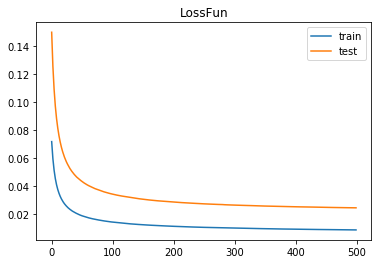

In [294]:
x = range(0,500)

plt.title('LossFun')
plt.plot(x, Ltrain, label='train')
plt.plot(x, Ltest, label='test')
plt.legend()

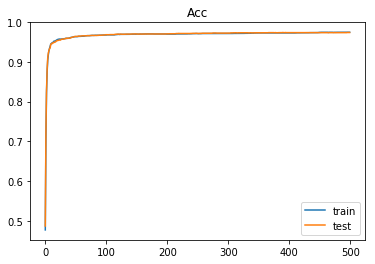

In [295]:
plt.title('Acc')
plt.plot(x, Atrain, label='train')
plt.plot(x, Atest, label='test')
plt.legend()

# Сохраняем данные для кагла

https://www.kaggle.com/t/513ea517806348848dc78c4f41d44528

Результат записывается в простой текстовый файл. Первая строчка "Id,Prediction", далее для каждого примера из валидационного множества записывается его Id (порядковый номер, с нуля) и вероятность принадлежности к классу '6', например '123,0.12'.

Важно соблюдать тот же порядок следования элементов, что и в наборе данных. Нумерация id с 0

In [297]:
X = test_no_lables['data'] 
X = X / 255
X = np.hstack([ np.ones((X.shape[0], 1)), X] )

Y_pred = np.dot(X, w)

#sigmoid
for j in range(Y_pred.shape[0]):
    Y_pred[j] = 1./(1. + math.exp(-Y_pred[j]))

with open('solution.csv', 'w') as fout:
    print("Id,Prediction", file=fout)
    for i in range(X.shape[0]):
        print(i, Y_pred[j], sep=',', file=fout)

# Сдача

1. Регистрируетесь на конкурс https://www.kaggle.com/t/34e77301ef914c5792e4f4306144a6b3 
1. Преодолеваете "Pass level" baseline
1. После того, как вы преодолеете baseline, присылайте ноутбук с решение по адресу **voropaev@corp.mail.ru**

# Внимание
- Тему письма писать в формате "[МФТИ][1] Фамилия"
- Внутри писма прикрепляете файл ноутбука с именем <ваша фамилия>.ipynb